# Part ONE - Project Based

`CONTEXT`: The data concerns **`city-cycle fuel consumption`** in **`miles per gallon`**, to be predicted in terms of 3 multivalued discrete and 5 continuous attributes.

`PROJECT OBJECTIVE`: Goal is to **cluster** the data and treat them as individual datasets to train **Regression models** to predict `mpg`.

### Importing the libraries

In [1]:
import numpy as np # mathematical manipulations
import pandas as pd # data manipulations
from pandas import ExcelWriter # for writing excel files with multiple sheets

# for visualisation
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('darkgrid')

# pre-processing of data
from sklearn.preprocessing import LabelEncoder # for one-hot encoding
from scipy.stats import zscore # for standardising the scale

from sklearn.model_selection import train_test_split # splitting into train and test sets

# ML model libraries
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans,AgglomerativeClustering # clustering

# various model performance measures
from sklearn.metrics import silhouette_samples,silhouette_score
from scipy.cluster.hierarchy import cophenet, dendrogram ,linkage, fcluster

from scipy.spatial.distance import pdist # pairwise distribution
from scipy.spatial.distance import cdist # computing distance between each pair

# ignore warnings
import warnings
warnings.filterwarnings("ignore")

### Import and warehouse data

In [2]:
# importing data to a data frame from json
mpg_json = pd.read_json('Part1 - Car-Attributes.json')

In [3]:
# checking top five rows to see if data is imported
mpg_json.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [4]:
# analysing shape of the dataframe
mpg_json.shape

(398, 8)

In [5]:
# importing data to a data frame from json
car_names = pd.read_csv('Part1 - Car name.csv')

In [6]:
# checking top five rows to see if data is imported
car_names.head()

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [7]:
# analysing shape of the dataframe
car_names.shape

(398, 1)

#### Observations:
- `mpg_json` has **398** rows and **8** columns.
- `car_names` has **398** rows and **1** column.
- From the two data frames it can be seen that there is no common column/feature for `merging` the datasets, so we will use either `join` or `concat` to combine the two dataframes as the `index` labels are same as well as the number of rows.

In [8]:
# combine by join()
mpg_combined = mpg_json.join(car_names) 

In [9]:
# combine by concat()
# mpg_combined = pd.concat([mpg_json,car_names],axis=1)

In [10]:
# checking top five rows to see if data is joined
mpg_combined.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [11]:
# analysing shape of the dataframe
mpg_combined.shape

(398, 9)

The datasets are combined properly as the final dataset has **398** rows and **9** columns.

In [12]:
# export combined dataframe to csv
mpg_combined.to_csv('mpg.csv',index=False) # didn't save the index value

In [13]:
# export combined dataframe to excel sheet
mpg_combined.to_excel('mpg.xlsx',sheet_name='Miles Per Gallon',index=False)

In [14]:
# export combined dataframe to excel sheet
# required if we want to write multiple sheets to single excel workbook
# writer = ExcelWriter('mpg.xlsx') # initialising the writer object
# mpg_combined.to_excel(writer,sheet_name='Miles Per Gallon',index=False)

In [15]:
# export combined dataframe to json
mpg_combined.to_json('mpg.json',orient='table',index=False)

We have exported combined dataframe to `.csv`, `.xlsx`, `.json` onto the local machine and we can choose any file extension to import data for future use and analysis.

In [16]:
# importing data to a data frame from csv
mpg = pd.read_csv('mpg.csv')

In [17]:
# checking top five rows to see if data is imported
mpg.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [18]:
# checking shape of the data imported to verify our import/export
mpg.shape

(398, 9)

In [19]:
# importing data to a data frame from excel
# mpg = pd.read_excel('mpg.xlsx')
# mpg.head()

In [20]:
# importing data to a data frame from json
# mpg = pd.read_json('mpg.json',orient='table')
# mpg.head()

### Data Cleansing

In [21]:
# checking null values
mpg.isnull().sum()

mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
car_name    0
dtype: int64

In [22]:
# seeing shape and data types of various features
mpg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    object 
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   yr        398 non-null    int64  
 7   origin    398 non-null    int64  
 8   car_name  398 non-null    object 
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


#### Observations:
- There are **398** data points and **9** features.
- There are **no** null values.
- `hp` by intuition should be a `number` but is an `object`. this might be due to some bad values.
- `origin` should be a categorical feature.

In [23]:
# checking for bad values in hp column
isHpDigit = mpg['hp'].str.isdigit()
mpg[isHpDigit == False] # seeing the bad value

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
32,25.0,4,98.0,?,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,?,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,?,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,?,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,?,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,?,3035,20.5,82,1,amc concord dl


In [24]:
# replacing ? with NaN
mpg['hp'].replace(to_replace='?',value=np.nan,inplace=True)
mpg['hp'] = mpg['hp'].astype('float64')  # change data type to float
mpg[isHpDigit == False] # seeing if the values are replaced

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
32,25.0,4,98.0,NaN,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,NaN,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,NaN,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,NaN,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,NaN,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,NaN,3035,20.5,82,1,amc concord dl


In [25]:
# replacing NaN with median
mpg['hp'].fillna(value=mpg['hp'].median(),inplace=True)

In [26]:
# replacing the categorical var with actual values
mpg['origin'].replace({1: 'america', 2: 'europe', 3: 'asia'},inplace=True)
mpg['origin'] = mpg['origin'].astype('category')  # change data type to category

In [27]:
# only numeric features are considered for clustering, hence we extract those by
# dropping non-numeric features froma copy of data frame
mpg_copy = mpg.copy() # creating copy of df to keep original data intact

In [28]:
def separate_numeric_and_non_numeric_features(df, num_col, cat_col):
    for col in df.columns:
        if str(df[col].dtypes) == 'category' or df[col].dtypes == 'object':
            cat_col.append(col)
        else:
            num_col.append(col)

In [29]:
numeric_features = [] # initialising list to hold numeric features
non_numeric_features = [] # initialising list to hold non-numeric features
# calling the function to separate out features based on data type
separate_numeric_and_non_numeric_features(mpg,numeric_features,non_numeric_features)

In [30]:
# dropping non-numeric features
mpg_copy.drop(non_numeric_features,axis=1,inplace=True) 

### Data Analysis and Visualisation

In [31]:
# 5-point summary and other statistical features of all features
mpg_copy.describe(include='all').transpose()

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
hp,398.0,104.304020,38.222625,46.0,76.000,93.5,125.000,230.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0


In [32]:
def pie_chart_and_count_plot(df,col_name):
    # initialising subplots
    figure, ax = plt.subplots(nrows=1, ncols=2)

    # setting figure parameters
    figure.set_figheight(7)
    figure.set_figwidth(15)
    
    #setting axes titles
    ax[0].set_title(f'Pie Chart of {col_name.upper()}')
    ax[1].set_title(f'Count plot of {col_name.upper()}')

    # plotting the distribution
    df[col_name].value_counts().plot.pie(ax=ax[0],autopct='%1.1f%%')
    sns.countplot(x=col_name,data=df,ax=ax[1])

    plt.show()

Values for ORIGIN
america    249
asia        79
europe      70
Name: origin, dtype: int64



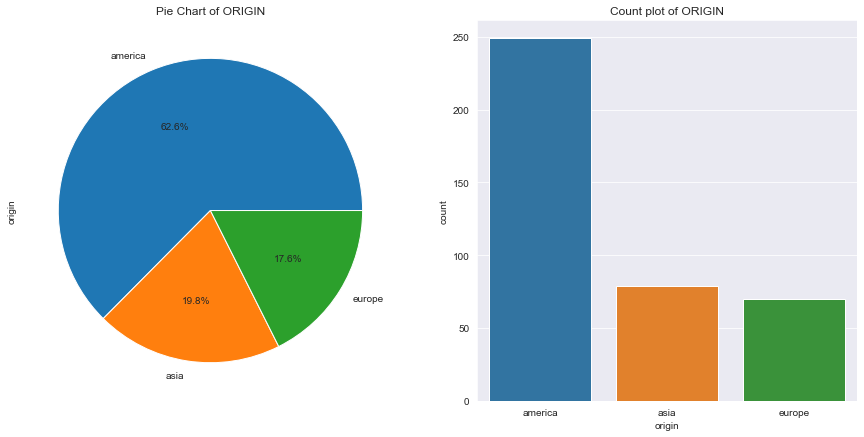

****************************************


In [33]:
# seeing various values for categorical variables
for col in non_numeric_features:
    if col != 'car_name':
        print(f'Values for {col.upper()}')
        print(mpg[col].value_counts())
        print()
        pie_chart_and_count_plot(mpg,col) # call to plotting function
        print('*'*40)

In [34]:
def calculateLowerAndUpperFence(df,col_name):
    Q1 = np.percentile(a=df[col_name],q=25) # 25th percentile
    Q3 = np.percentile(a=df[col_name],q=75) # 75th percentile
    IQR = Q3 - Q1 # inter-quartile-range
    cut_off = 1.5 * IQR
    # limit for outliers
    lower_fence = Q1 - cut_off
    upper_fence = Q3 + cut_off
    return lower_fence,upper_fence

In [35]:
def number_of_outliers(df,col_name,lower_fence,upper_fence):
    outliers = np.where((df[col_name] < lower_fence) | (df[col_name] > upper_fence))
    number_of_outliers = len(outliers[0])
    return number_of_outliers

In [36]:
def plotHistogramAndBoxPlotWithOutliers(df,col_name, outlier_col):
    # initialising subplots
    figure, ax = plt.subplots(nrows=1, ncols=2)

    # setting figure parameters
    figure.set_figheight(5)
    figure.set_figwidth(15)

    #setting axes titles
    ax[0].set_title(f'Distribution plot of {col_name.upper()}')
    ax[1].set_title(f'Box plot of {col_name.upper()}')

    # plotting the distribution
    sns.histplot(data=df[col_name],ax=ax[0],kde=True,color='g')
    sns.boxplot(x=df[col_name],ax=ax[1])

    plt.show()

    # figuring upper and lower limits
    lower_fence,upper_fence = calculateLowerAndUpperFence(df,col_name)

    # logical selection of outliers
    no_of_outliers = number_of_outliers(df,col_name,lower_fence,upper_fence)
    if no_of_outliers > 0:
        outlier_col.append(col_name)
        print(f'The number of outliers for {col_name} are {no_of_outliers}')

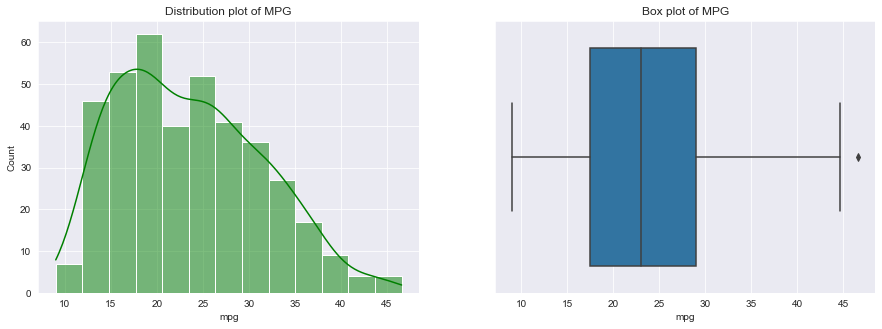

The number of outliers for mpg are 1
****************************************


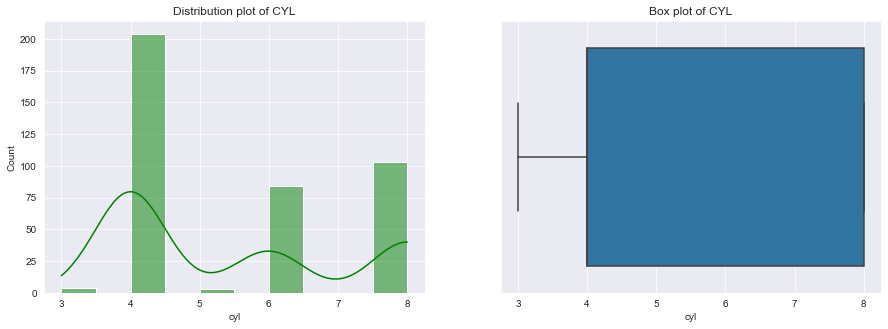

****************************************


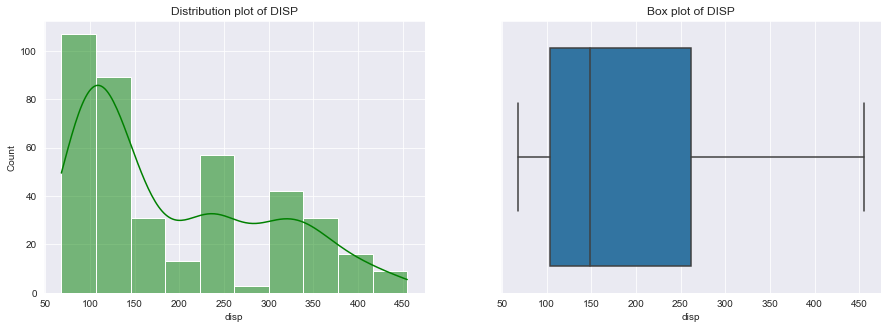

****************************************


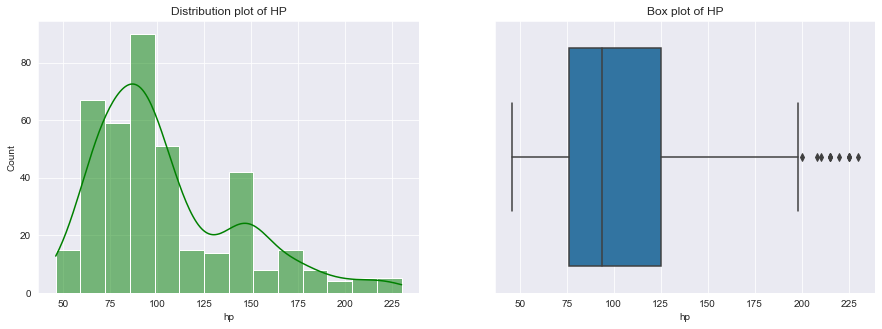

The number of outliers for hp are 11
****************************************


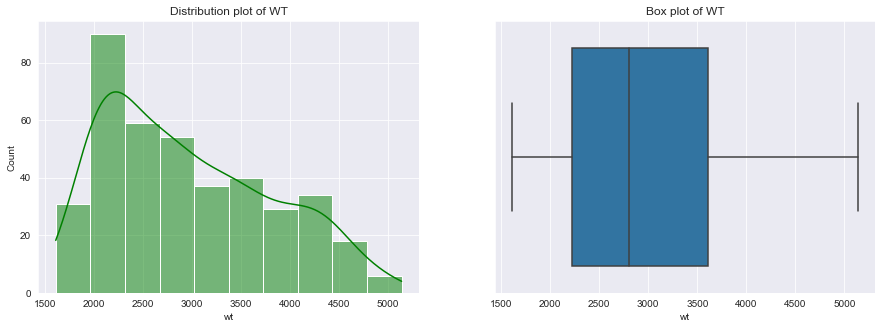

****************************************


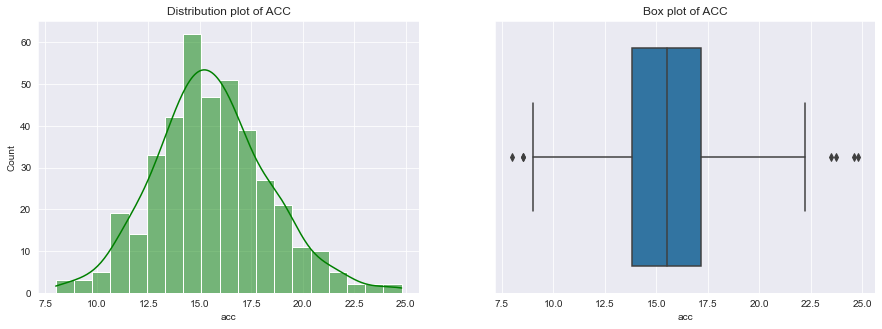

The number of outliers for acc are 7
****************************************


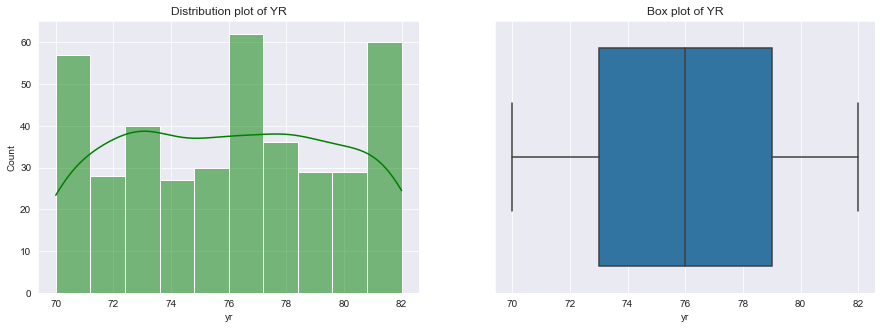

****************************************


In [37]:
outlier_cols = [] # initialising list to hold outlier columns
for col in numeric_features:
    plotHistogramAndBoxPlotWithOutliers(mpg,col,outlier_cols) # call to appropriate function
    print('*'*40)

#### Observations:
From `describe()` and the visual analysis we could observe:
- The **5-point** summary of all numeric features.
- The distribution of `disp`, `hp`, `wt` are **skewed**.
- There are very few outliers in `acc`, `hp`, `mpg`.
- There are more american origin cars than asia and europe.

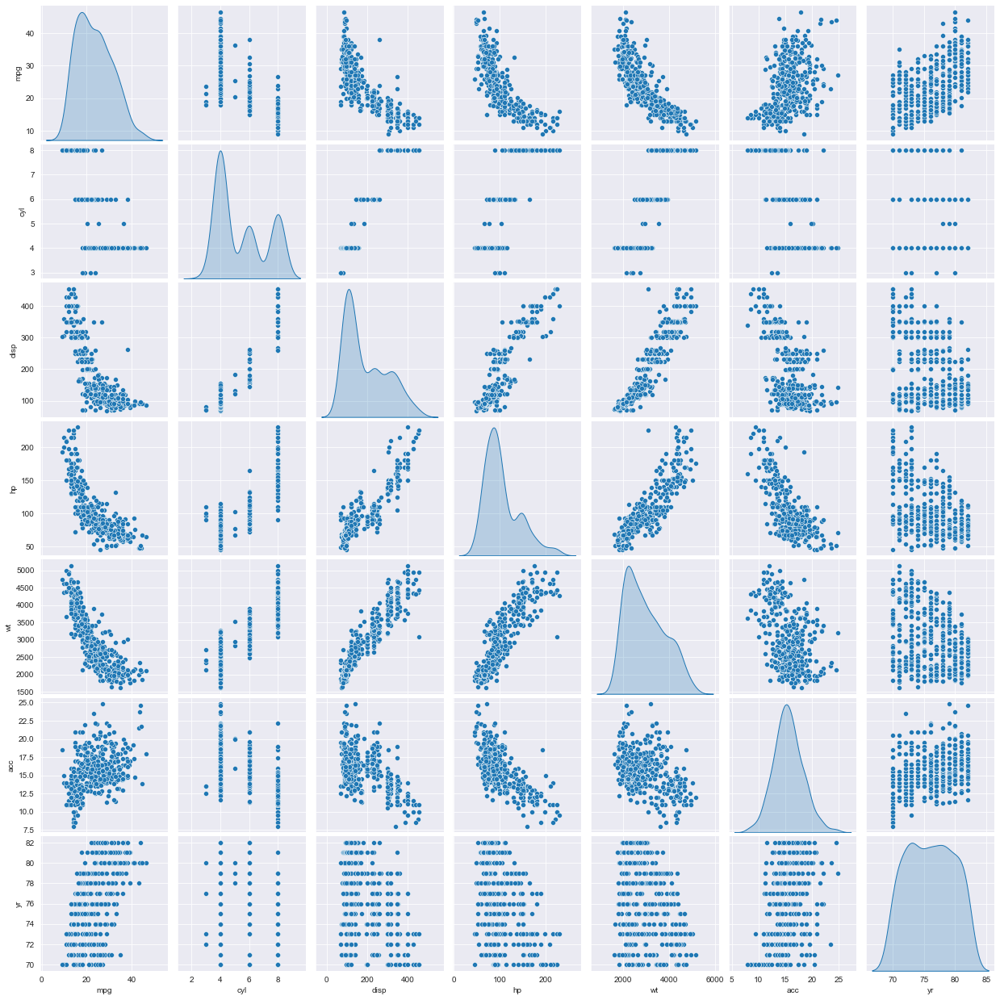

In [38]:
# pairwise scatter plots and the distributions
sns.pairplot(data=mpg_copy,diag_kind='kde') 
plt.show()

In [39]:
corr = mpg_copy.corr() # finding the correlation matrix
corr

,mpg,cyl,disp,hp,wt,acc,yr
mpg,1.000000,-0.775396,-0.804203,-0.773453,-0.831741,0.420289,0.579267
cyl,-0.775396,1.000000,0.950721,0.841284,0.896017,-0.505419,-0.348746
disp,-0.804203,0.950721,1.000000,0.895778,0.932824,-0.543684,-0.370164
hp,-0.773453,0.841284,0.895778,1.000000,0.862442,-0.686590,-0.413733
wt,-0.831741,0.896017,0.932824,0.862442,1.000000,-0.417457,-0.306564
acc,0.420289,-0.505419,-0.543684,-0.686590,-0.417457,1.000000,0.288137
yr,0.579267,-0.348746,-0.370164,-0.413733,-0.306564,0.288137,1.000000


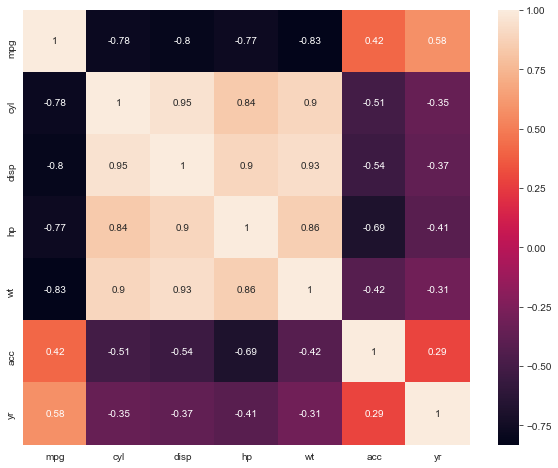

In [40]:
# visualisation of correlation matrix
plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True)
plt.show()

#### Observations:
- From the `pairplot` or `correlation matrix` or the `heatmap` we can see there is very high **negative** correlation as well as very high **positive** correlation between features like `mpg vs wt,hp,disp,cyl` and `hp vs wt,disp,cyl`respectively.
- Also, from `pairplot` of `kde`, it seems **3 to 4** clusters seem to be appropriate.
- Imputing values in `outlier_columns` by bringing values lower than `lower_fence` upto lower_fence and values higher than `upper_fence` upto upper_fence.
- I chose this approach of correcting outliers rather than imputimg to `mean`, `median` or `zero`, because those would change concentration of data and also outliers are more similar to the boundary elements.

In [41]:
def pull_outliers_to_quartile_limits(df,outlier_cols):
    for col_name in outlier_cols:
        lower_fence,upper_fence = calculateLowerAndUpperFence(df,col_name)
        print(f'The number of outliers for {col_name} before imputing are {number_of_outliers(df,col_name,lower_fence,upper_fence)}')

        col_index = df.columns.get_loc(col_name)
        # imputing values lower than lower fence equal to lower fence
        for row_index in np.where(df[col_name] < lower_fence)[0]:
            df.iloc[[row_index],[col_index]] = lower_fence

        # imputing values higher than upper fence equal to upper fence
        for row_index in np.where(df[col_name] > upper_fence)[0]:
            df.iloc[[row_index],[col_index]] = upper_fence
        
        print(f'The number of outliers for {col_name} after imputing are {number_of_outliers(df,col_name,lower_fence,upper_fence)}')
        print()

In [42]:
pull_outliers_to_quartile_limits(mpg_copy,outlier_cols)  # call to appropriate function

The number of outliers for mpg before imputing are 1
The number of outliers for mpg after imputing are 0

The number of outliers for hp before imputing are 11
The number of outliers for hp after imputing are 0

The number of outliers for acc before imputing are 7
The number of outliers for acc after imputing are 0



### Machine Learning

In [43]:
# standardising the data as the distance measures are very sensitive to scale
mpg_scaled = mpg_copy.apply(zscore)

#### K-Means

In [44]:
clusters = range(2,10) # number of clusters to try
meanDistortions = [] 
silhouette_scores = []

for k in clusters:
    model=KMeans(n_clusters=k) # model object
    model.fit(mpg_scaled) # fit the model
    prediction = model.predict(mpg_scaled) # making predictions
    # taking minimum distortions
    meanDistortions.append(sum(np.min(cdist(mpg_scaled, model.cluster_centers_, 'euclidean'), axis=1)) / mpg_scaled.shape[0])
    score = silhouette_score(mpg_scaled,model.labels_) # calculating silhouette score
    silhouette_scores.append(score)

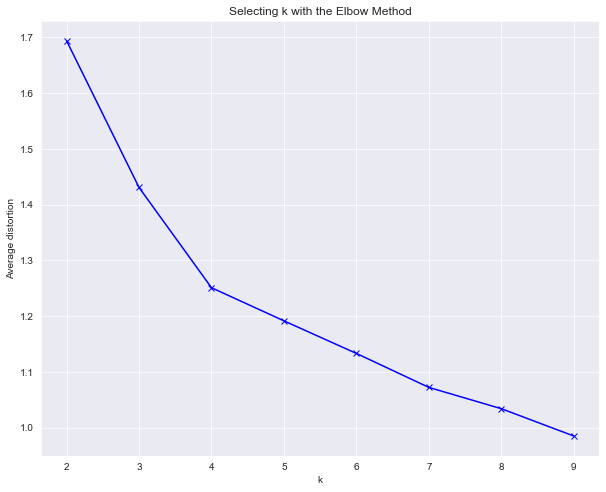

In [45]:
# plotting the average distortion
plt.figure(figsize=(10,8))
plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')
plt.show()

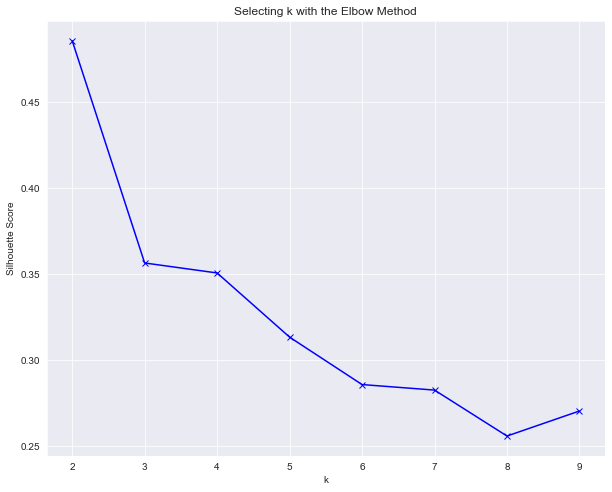

In [46]:
# plotting the silhouette scores
plt.figure(figsize=(10,8))
plt.plot(clusters, silhouette_scores, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Selecting k with the Elbow Method')
plt.show()

#### Observations:
- From `pairplot` we had come at an early conclusion that the number of clusters are around 3 to 4.
- Seeing from `Elbow Method`, it seems we can subjectively argue to have either clusters around 4 or 6.

**K = 4**

In [47]:
model = KMeans(n_clusters=4) # model object
model.fit(mpg_scaled) # fit the model
prediction = model.predict(mpg_scaled) # making predictions

# append to the data frame
mpg_copy['GROUP'] = prediction # for seeing difference, original data frame
mpg_scaled['GROUP'] = prediction # for scale difference for box plot
mpg['GROUP_K4'] = prediction # to original data set for running Linear Regression
mpg_scaled.head()

,mpg,cyl,disp,hp,wt,acc,yr,GROUP
0,-0.706560,1.498191,1.090604,0.713692,0.630870,-1.320595,-1.627426,3
1,-1.090999,1.498191,1.503514,1.666741,0.854333,-1.506489,-1.627426,3
2,-0.706560,1.498191,1.196232,1.258291,0.550470,-1.692383,-1.627426,3
3,-0.962852,1.498191,1.061796,1.258291,0.546923,-1.320595,-1.627426,3
4,-0.834706,1.498191,1.042591,0.985992,0.565841,-1.878278,-1.627426,3


In [48]:
mpg_copy.groupby(by=['GROUP']).describe()

mpg                                                             cyl  \
       count       mean       std   min     25%    50%     75%    max  count   
GROUP                                                                          
0      114.0  32.724123  5.013536  22.3  29.575  32.35  36.000  46.25  114.0   
1       90.0  19.621111  2.819216  15.0  18.000  19.00  20.950  28.80   90.0   
2      100.0  25.056000  3.528164  18.0  23.000  25.00  27.000  35.00  100.0   
3       94.0  14.429787  2.143900   9.0  13.000  14.00  15.875  20.20   94.0   

                 ...     acc           yr                                   \
           mean  ...     75%   max  count       mean       std   min   25%   
GROUP            ...                                                         
0      4.052632  ...  18.000  22.2  114.0  80.078947  1.657083  76.0  79.0   
1      6.177778  ...  17.675  22.2   90.0  76.200000  3.024990  70.0  74.0   
2      4.010000  ...  18.000  22.2  100.0  73.590000  2.278999  70.0  72.0   
3      8.000000  ...  13.650  18.5   94.0  73.468085  2.754086  70.0  71.0   

                          
        50%    75%   max  
GROUP                     
0      80.0  81.75  82.0  
1      76.0  78.00  82.0  
2      74.0  75.00  78.0  
3      73.0  76.00  79.0  

[4 rows x 56 columns]

In [49]:
mpg_copy.groupby(by=['GROUP']).mean()

,mpg,cyl,disp,hp,wt,acc,yr
GROUP,,,,,,,
0,32.724123,4.052632,112.026316,76.035088,2320.385965,16.543860,80.078947
1,19.621111,6.177778,225.511111,103.005556,3262.855556,16.392222,76.200000
2,25.056000,4.010000,110.125000,83.095000,2331.980000,16.448000,73.590000
3,14.429787,8.000000,350.042553,160.218085,4157.978723,12.591489,73.468085


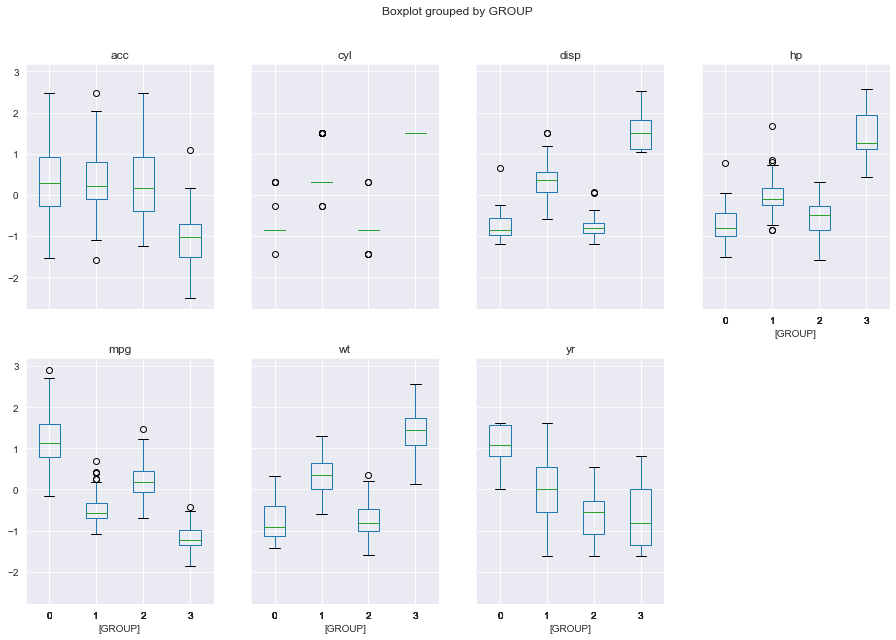

In [50]:
mpg_scaled.boxplot(by='GROUP',layout=(2,4),figsize=(15,10))
plt.show()

**K = 6**

In [51]:
model = KMeans(n_clusters=6) # model object
model.fit(mpg_scaled) # fit the model
prediction = model.predict(mpg_scaled) # making predictions

# append to the data frame
mpg_copy['GROUP'] = prediction # for seeing difference, original data frame
mpg_scaled['GROUP'] = prediction # for scale difference for box plot
mpg_scaled.head()

,mpg,cyl,disp,hp,wt,acc,yr,GROUP
0,-0.706560,1.498191,1.090604,0.713692,0.630870,-1.320595,-1.627426,0
1,-1.090999,1.498191,1.503514,1.666741,0.854333,-1.506489,-1.627426,0
2,-0.706560,1.498191,1.196232,1.258291,0.550470,-1.692383,-1.627426,0
3,-0.962852,1.498191,1.061796,1.258291,0.546923,-1.320595,-1.627426,0
4,-0.834706,1.498191,1.042591,0.985992,0.565841,-1.878278,-1.627426,0


In [52]:
mpg_copy.groupby(by=['GROUP']).describe()

mpg                                                           cyl  \
      count       mean       std   min    25%    50%     75%    max count   
GROUP                                                                       
0      94.0  14.429787  2.143900   9.0  13.00  14.00  15.875  20.20  94.0   
1      68.0  24.633824  3.008178  18.0  23.00  24.75  27.000  31.00  68.0   
2      74.0  31.948649  4.334988  22.3  29.00  32.05  34.650  44.60  74.0   
3      32.0  25.953125  4.355863  19.0  22.75  26.00  29.250  35.00  32.0   
4      89.0  19.517978  2.658971  15.0  18.00  19.00  20.800  26.80  89.0   
5      41.0  34.028049  5.851667  23.0  30.00  33.00  38.000  46.25  41.0   

                 ...     acc          yr                                   \
           mean  ...     75%   max count       mean       std   min   25%   
GROUP            ...                                                        
0      8.000000  ...  13.650  18.5  94.0  73.468085  2.754086  70.0  71.0   
1      4.014706  ...  16.000  17.6  68.0  73.941176  2.330091  70.0  72.0   
2      4.040541  ...  16.175  17.3  74.0  79.891892  1.668135  76.0  79.0   
3      4.000000  ...  19.750  22.2  32.0  72.843750  2.001763  70.0  71.0   
4      6.179775  ...  17.700  22.2  89.0  76.168539  3.027285  70.0  74.0   
5      4.121951  ...  19.900  22.2  41.0  80.390244  1.594962  76.0  80.0   

                         
        50%   75%   max  
GROUP                    
0      73.0  76.0  79.0  
1      74.0  76.0  78.0  
2      80.0  81.0  82.0  
3      72.5  74.0  77.0  
4      76.0  78.0  82.0  
5      81.0  82.0  82.0  

[6 rows x 56 columns]

In [53]:
mpg_copy.groupby(by=['GROUP']).mean()

,mpg,cyl,disp,hp,wt,acc,yr
GROUP,,,,,,,
0,14.429787,8.000000,350.042553,160.218085,4157.978723,12.591489,73.468085
1,24.633824,4.014706,115.000000,89.058824,2404.779412,15.147059,73.941176
2,31.948649,4.040541,113.770270,79.675676,2290.351351,15.095946,79.891892
3,25.953125,4.000000,99.765625,70.421875,2177.281250,19.212500,72.843750
4,19.517978,6.179775,226.101124,102.870787,3270.359551,16.449438,76.168539
5,34.028049,4.121951,110.365854,70.414634,2381.292683,19.029268,80.390244


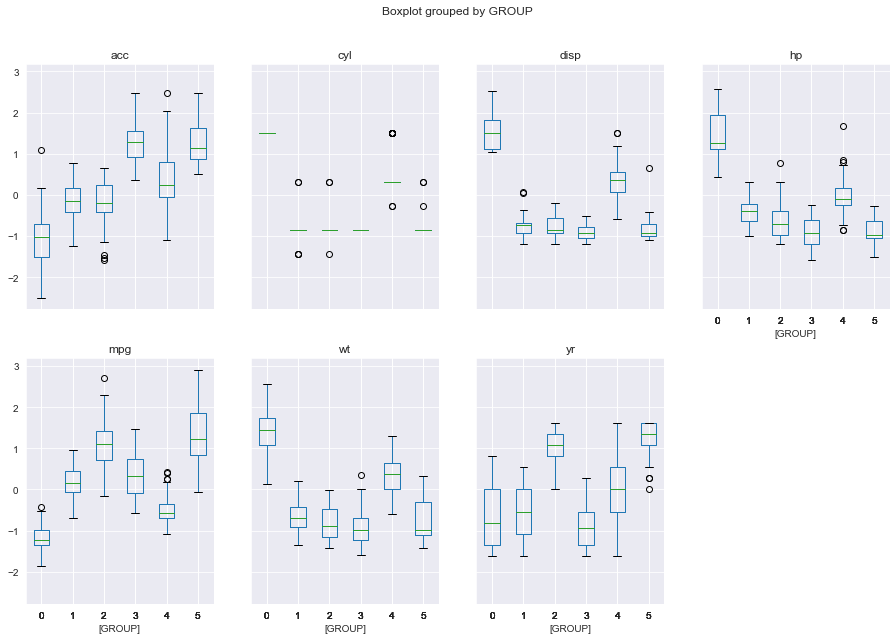

In [54]:
mpg_scaled.boxplot(by='GROUP',layout=(2,4),figsize=(15,10))
plt.show()

#### Hierarchical Clustering

In [55]:
# building model object with already decided clusters
model = AgglomerativeClustering(n_clusters=4,affinity='euclidean',linkage='average')

# fit the model
model.fit(mpg_scaled)

# cluster labels for each point
mpg_copy['GROUP'] = model.labels_
mpg_scaled['GROUP'] = model.labels_
mpg_scaled.head()

,mpg,cyl,disp,hp,wt,acc,yr,GROUP
0,-0.706560,1.498191,1.090604,0.713692,0.630870,-1.320595,-1.627426,3
1,-1.090999,1.498191,1.503514,1.666741,0.854333,-1.506489,-1.627426,3
2,-0.706560,1.498191,1.196232,1.258291,0.550470,-1.692383,-1.627426,3
3,-0.962852,1.498191,1.061796,1.258291,0.546923,-1.320595,-1.627426,3
4,-0.834706,1.498191,1.042591,0.985992,0.565841,-1.878278,-1.627426,3


Actually in **hierarchical clustering** we do not decide the number of clusters in advance, but build all possible clusters with various `linkage`, and then decide based on `cophenetic index` the cluster that suits the situation and also based on the `dendrogram` can decide the number of clusters to keep.

Cophenetic Correlation Coeff for average linkage is 0.770939946260354



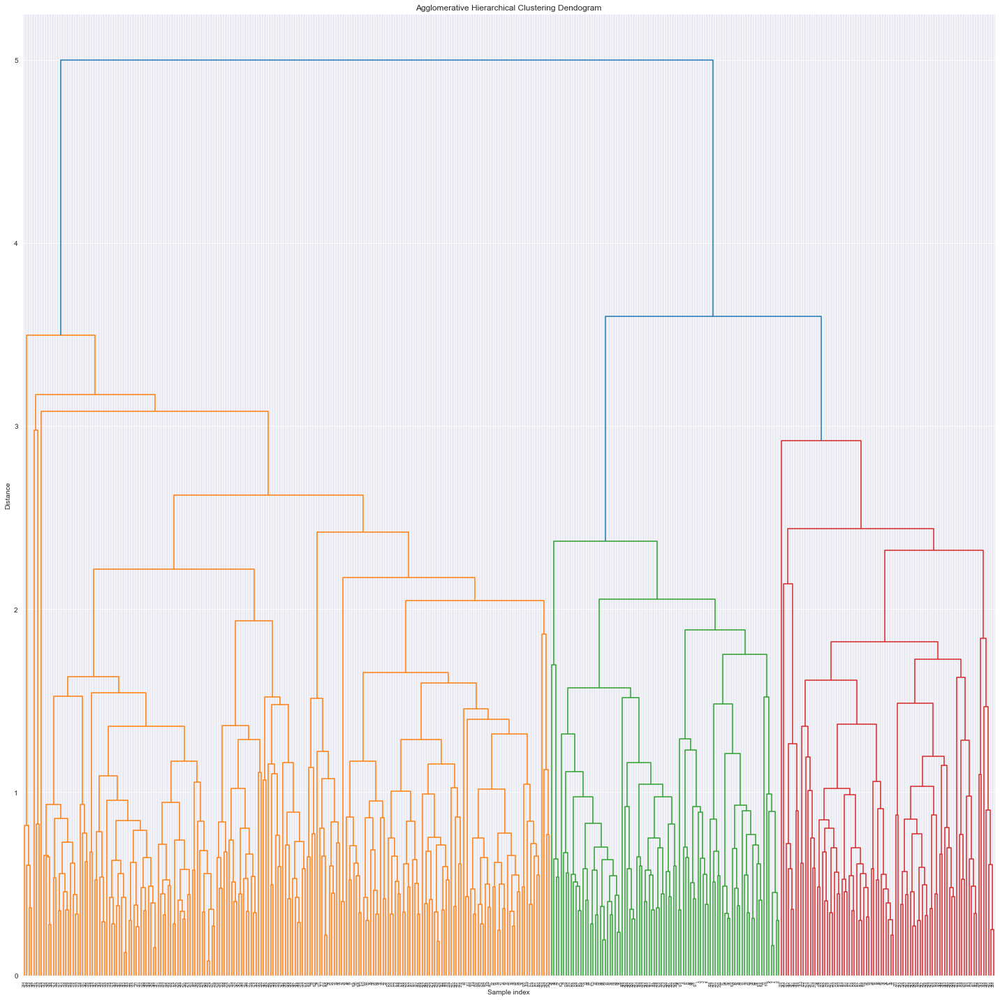

****************************************
Cophenetic Correlation Coeff for complete linkage is 0.7986245990773655



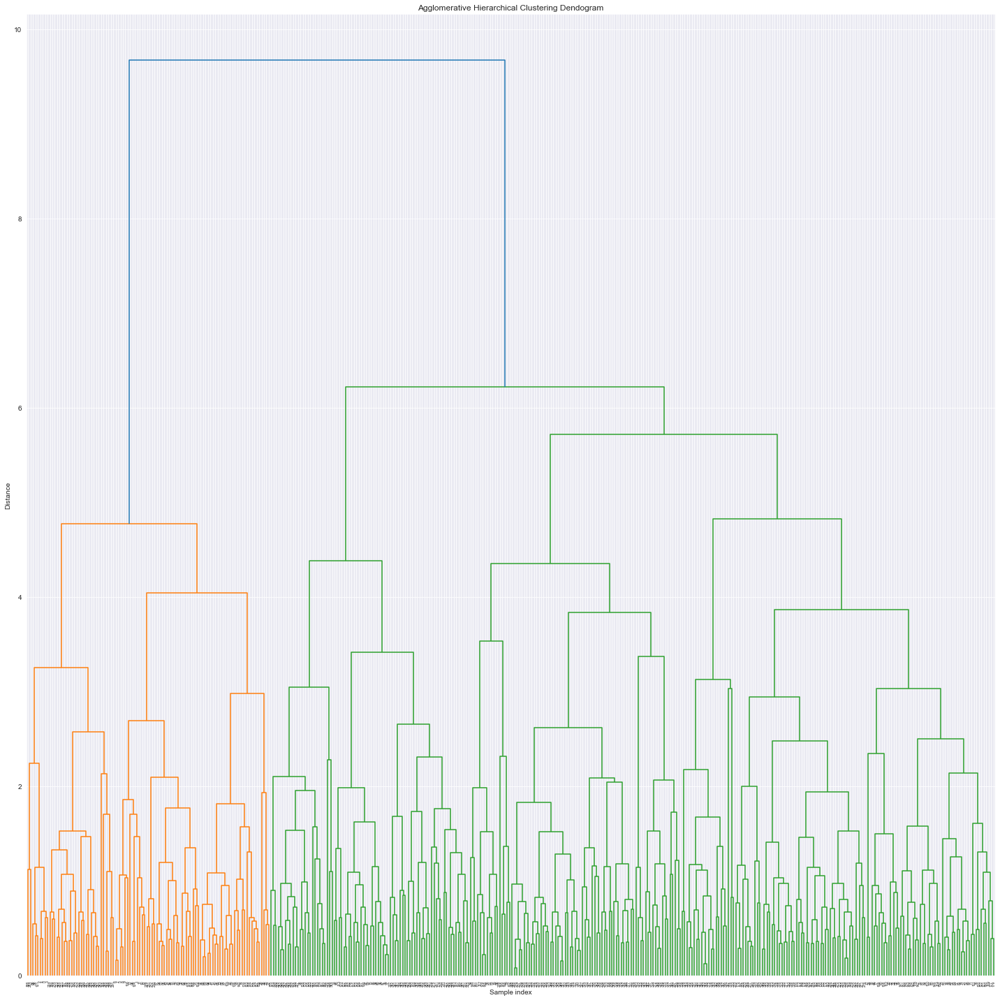

****************************************
Cophenetic Correlation Coeff for ward linkage is 0.7564003468959983



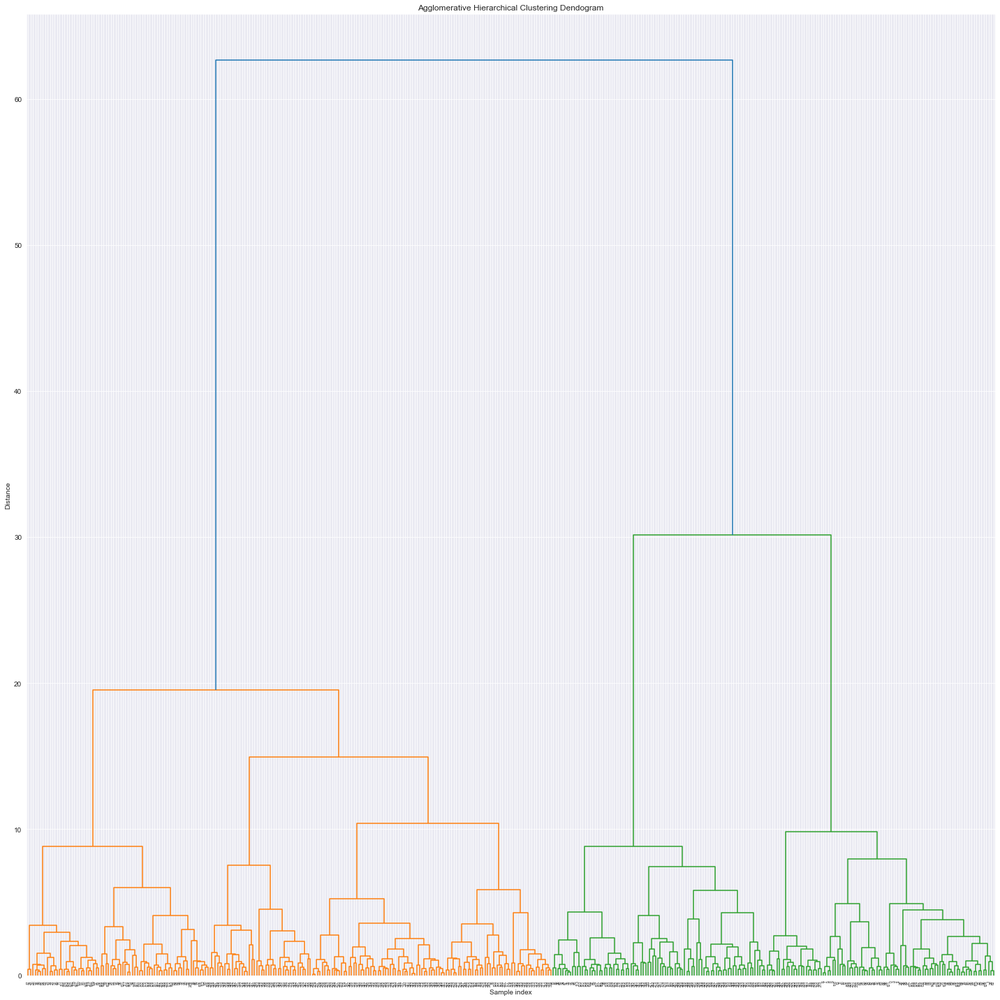

****************************************


In [56]:
linkage_methods = ['average', 'complete', 'ward']

for link in linkage_methods:
    z = linkage(y= mpg_scaled, method=link,metric='euclidean')
    cop_corr, cop_dist = cophenet(z, pdist(mpg_scaled))
    print(f'Cophenetic Correlation Coeff for {link} linkage is {cop_corr}') # correlation coeff
    print()
    
    # plotting the dendrogram
    plt.figure(figsize=(20, 20))
    plt.title('Agglomerative Hierarchical Clustering Dendogram')
    plt.xlabel('Sample index')
    plt.ylabel('Distance')
    dendrogram(z)
    plt.tight_layout()
    plt.show()
    
    print('*'*40)

- We can tweak other parameters too to arrive at number of clusters with high correlation.
- As there is high clutter in the diagram, suppose we want 4 clusters, we can achieve that as below.

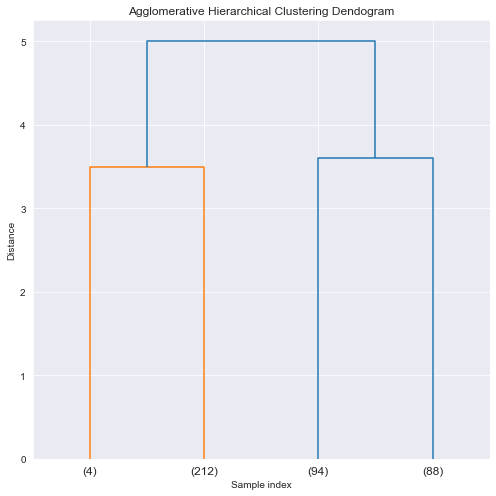

In [57]:
z = linkage(y= mpg_scaled, method='average',metric='euclidean')

# plotting the dendrogram
plt.figure(figsize=(7, 7))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('Sample index')
plt.ylabel('Distance')
dendrogram(z, truncate_mode='lastp',p=4)
plt.tight_layout()
plt.show()


#adding the clusters formed to original data set
clusters = fcluster(z, 4, criterion='maxclust')
mpg_scaled['GROUP'] = clusters
mpg_copy['GROUP'] = clusters
mpg['GROUP_H4'] = clusters

In [58]:
mpg_copy.groupby(by=['GROUP']).describe()

mpg                                                            cyl  \
       count       mean       std   min     25%   50%     75%    max  count   
GROUP                                                                         
1        4.0  43.700000  0.547723  43.1  43.325  43.7  44.075  44.30    4.0   
2      212.0  28.846934  5.486746  18.0  25.000  28.0  32.475  46.25  212.0   
3       94.0  14.429787  2.143900   9.0  13.000  14.0  15.875  20.20   94.0   
4       88.0  19.451136  2.597921  15.0  18.000  19.0  20.650  26.80   88.0   

                 ...     acc           yr                                   \
           mean  ...     75%   max  count       mean       std   min   25%   
GROUP            ...                                                         
1      4.000000  ...  22.200  22.2    4.0  80.000000  1.632993  78.0  79.5   
2      4.047170  ...  17.925  22.2  212.0  77.009434  3.790723  70.0  74.0   
3      8.000000  ...  13.650  18.5   94.0  73.468085  2.754086  70.0  71.0   
4      6.193182  ...  17.625  22.2   88.0  76.136364  3.029289  70.0  74.0   

                         
        50%   75%   max  
GROUP                    
1      80.0  80.5  82.0  
2      77.5  80.0  82.0  
3      73.0  76.0  79.0  
4      76.0  78.0  82.0  

[4 rows x 56 columns]

In [59]:
mpg_copy.groupby(by=['GROUP']).mean()

,mpg,cyl,disp,hp,wt,acc,yr
GROUP,,,,,,,
1,43.700000,4.000000,91.750000,49.000000,2133.750000,21.900000,80.000000
2,28.846934,4.047170,112.134434,80.063679,2336.377358,16.389623,77.009434
3,14.429787,8.000000,350.042553,160.218085,4157.978723,12.591489,73.468085
4,19.451136,6.193182,226.590909,103.164773,3267.409091,16.407955,76.136364


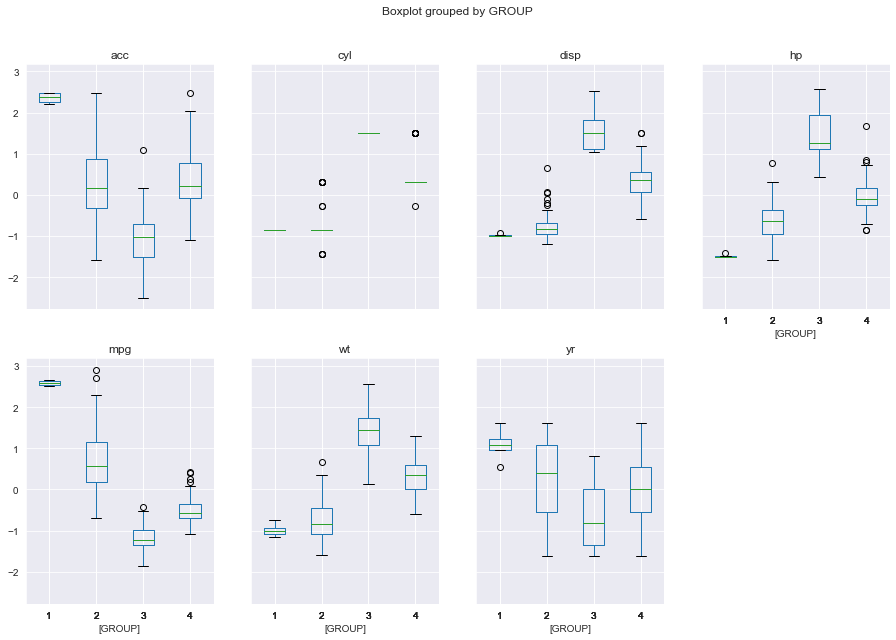

In [60]:
mpg_scaled.boxplot(by='GROUP',layout=(2,4),figsize=(15,10))
plt.show()

#### Observations:
| **Hierarchical Clustering** | **K-Means Clustering** |
| --- | --- |
| connectivity-based clustering | centroid-based clustering |
| computation time is more | less computation time |
| we can select any number of clusters | number of clusters are decided at model building time |
| uses dendrogram to decide on number of clusters | uses elbow method to decide on number of clusters |
| increases quadratic | increases linearly |
| uses agglomerative or divisive algorithms | used Llyod's algorithm |
| can use any distance and linkage measures | uses Eucledian distance measure | 

#### Observations:
In my opinion **4** seems to be optimal number of clusters because:
- from `elbow method` this is the point of clusters were the chnage in average distortion tends to smooth out.
- from `silhouette coeff` it is the point were the coeff is high with minimal distortion, thus a balance of `compression` and `accuracy`.
- from `groupby()` for `mean` or `standard deviation` the clusters formed seem to be different from one another.

#### Linear Regression on data set without clusters

In [61]:
# making the clusters as categorical
mpg['GROUP_K4'] = mpg['GROUP_K4'].astype('category')
mpg['GROUP_H4'] = mpg['GROUP_H4'].astype('category')

In [62]:
# dummy variables - One_hot Encoding
mpg = pd.get_dummies(data= mpg, columns=['origin','GROUP_K4','GROUP_H4'])
mpg.head()
# splits n categorical variable values into n columns, but we can use n-1 columns, because we can know the state of all

,mpg,cyl,disp,hp,wt,acc,yr,car_name,origin_america,origin_asia,origin_europe,GROUP_K4_0,GROUP_K4_1,GROUP_K4_2,GROUP_K4_3,GROUP_H4_1,GROUP_H4_2,GROUP_H4_3,GROUP_H4_4
0,18.0,8,307.0,130.0,3504,12.0,70,chevrolet chevelle malibu,1,0,0,0,0,0,1,0,0,1,0
1,15.0,8,350.0,165.0,3693,11.5,70,buick skylark 320,1,0,0,0,0,0,1,0,0,1,0
2,18.0,8,318.0,150.0,3436,11.0,70,plymouth satellite,1,0,0,0,0,0,1,0,0,1,0
3,16.0,8,304.0,150.0,3433,12.0,70,amc rebel sst,1,0,0,0,0,0,1,0,0,1,0
4,17.0,8,302.0,140.0,3449,10.5,70,ford torino,1,0,0,0,0,0,1,0,0,1,0


In [63]:
# drop the dependant variable and also the nth dummy variable

# independant variables without clusters
X = mpg.drop(columns=['mpg','origin_europe', 'car_name','GROUP_K4_0','GROUP_K4_1','GROUP_K4_2','GROUP_K4_3','GROUP_H4_1','GROUP_H4_2','GROUP_H4_3','GROUP_H4_4'],axis=1)

# dependant variable
y = mpg[['mpg']]

In [64]:
# split data into training and test data in 70:30 ratio
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.30,random_state=1)

In [65]:
regression_model = LinearRegression()
regression_model.fit(X_train,y_train)  # fit the linear regression model

LinearRegression()

In [66]:
# coefficients of various independant variables
for indx, col_name in enumerate(X_train.columns):
    print(f'The Regression coefficient for {col_name} is {regression_model.coef_[0][indx]}')
    
# also the variables don't only influence mpg they influence each other too

The Regression coefficient for cyl is -0.39480796616482017
The Regression coefficient for disp is 0.028945510765487167
The Regression coefficient for hp is -0.02175220772354671
The Regression coefficient for wt is -0.007352032065147344
The Regression coefficient for acc is 0.06191936600761839
The Regression coefficient for yr is 0.8369338917644991
The Regression coefficient for origin_america is -3.0012830009185163
The Regression coefficient for origin_asia is -0.6060179643247368


In [67]:
intercept = regression_model.intercept_[0]
print(f'The intercept is {intercept}')

The intercept is -18.283451116372103


In [68]:
#R^2 for in-sample/training
in_sample_score_without_clusters = regression_model.score(X_train,y_train)
print(f'In-Sample score without clusters is {in_sample_score_without_clusters}')

In-Sample score without clusters is 0.8141025501610559


In [69]:
#R^2 for out-sample/testing
out_sample_score_without_clusters = regression_model.score(X_test,y_test)
print(f'Out-Sample score without clusters is {out_sample_score_without_clusters}')

Out-Sample score without clusters is 0.8433135132808833


#### Linear Regression on data set with K-Means clusters

In [70]:
# drop the dependant variable and also the nth dummy variable

# independant variables with K-Means clusters
X = mpg.drop(columns=['mpg','origin_europe', 'car_name','GROUP_K4_3','GROUP_H4_1','GROUP_H4_2','GROUP_H4_3','GROUP_H4_4'],axis=1)

# dependant variable
y = mpg[['mpg']]

In [71]:
# split data into training and test data in 70:30 ratio
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.30,random_state=1)

In [72]:
regression_model = LinearRegression()
regression_model.fit(X_train,y_train)  # fit the linear regression model

LinearRegression()

In [73]:
# coefficients of various independant variables
for indx, col_name in enumerate(X_train.columns):
    print(f'The Regression coefficient for {col_name} is {regression_model.coef_[0][indx]}')
    
# also the variables don't only influence mpg they influence each other too

The Regression coefficient for cyl is 1.634501749036185
The Regression coefficient for disp is 0.015291016964198132
The Regression coefficient for hp is -0.039226308573234996
The Regression coefficient for wt is -0.0056692688686669716
The Regression coefficient for acc is 0.13917911671698766
The Regression coefficient for yr is 0.3586288401372979
The Regression coefficient for origin_america is -3.0663035121939606
The Regression coefficient for origin_asia is -0.7848913538076852
The Regression coefficient for GROUP_K4_0 is 10.336805112233936
The Regression coefficient for GROUP_K4_1 is 0.6296220121495208
The Regression coefficient for GROUP_K4_2 is 4.557441506950371


In [74]:
intercept = regression_model.intercept_[0]
print(f'The intercept is {intercept}')

The intercept is 1.0826278914466307


In [75]:
#R^2 for in-sample/training
in_sample_score_with_k_means_clusters = regression_model.score(X_train,y_train)
print(f'In-Sample score with K-Means clusters is {in_sample_score_with_k_means_clusters}')

In-Sample score with K-Means clusters is 0.8771119915206057


In [76]:
#R^2 for out-sample/testing
out_sample_score_with_k_means_clusters = regression_model.score(X_test,y_test)
print(f'Out-Sample score with K-Means clusters is {out_sample_score_with_k_means_clusters}')

Out-Sample score with K-Means clusters is 0.8794030418447716


In [77]:
model_lists = []
model_lists.append(['Linear Regression on Original Data set',in_sample_score_without_clusters*100 ,out_sample_score_without_clusters*100])
model_lists.append(['Linear Regression with Clustering', in_sample_score_with_k_means_clusters*100, out_sample_score_with_k_means_clusters*100])
mdl_df = pd.DataFrame(model_lists, columns = ['Model','r^2 on Train Data','r^2 on Test Data'])
mdl_df

,Model,r^2 on Train Data,r^2 on Test Data
0,Linear Regression on Original Data set,81.410255,84.331351
1,Linear Regression with Clustering,87.711199,87.940304


#### Obseravtions:
- `LinearRegression` on the original data set seems to over-fit as it performed better on train data than test data.
- `LinearRegression` with clustering performed **equally** well on train and test data. Also, in contrast to original data set the accuracy on the test data **increased**.

### Improvisations:
- `K-means` appears to explain the highest variation in the datset, with an increase of 3% on train set when compared with other models.
- To get more clarity a larger dataset may be used, since this is a dataset of used cars it doesn't give us how many previous owners has the cars seen which might be helful variable. 
- The purpose that the cars were being used is also an important factor which the dataset doen't capture.
- With the above mentioned features it may be possible to get a higher accuracy or explainability of the models and its variables.

# ---------------------------------------------------------------------------------------------------------------

# Part Two- Project Based

`CONTEXT`: Company X curates and packages wine across various vineyards spread throughout the country.

`PROJECT OBJECTIVE`: Goal is to build a synthetic data generation model using the existing data provided by the company.

### Importing the necessary libraries

In [78]:
# majority of the libraries are imported already into the notebook from above
from sklearn.linear_model import LogisticRegression # for classification

# model performance measures
from sklearn.metrics import confusion_matrix

### Importing the data

In [79]:
# importing data to a data frame from xlsx
company = pd.read_excel('Part2 - Company.xlsx')

# verifying the import by seeing top 5 records
company.head()

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


In [80]:
# analysing shape of data set
company.shape

(61, 5)

In [81]:
# seeing datatypes
company.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        61 non-null     int64 
 1   B        61 non-null     int64 
 2   C        61 non-null     int64 
 3   D        61 non-null     int64 
 4   Quality  43 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.5+ KB


In [82]:
company.isnull().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

#### Observations:
- `company` dataframe has **61** datapoints, **4** independant features and **1** dependant feature as `Quality`.
- All features seem to be in correct format except `Quality`.
- `Quality` has **18 null values**. 

### Analysis and Visualisation

In [83]:
# analysing unique values in the output
company['Quality'].unique()

array(['Quality A', 'Quality B', nan], dtype=object)

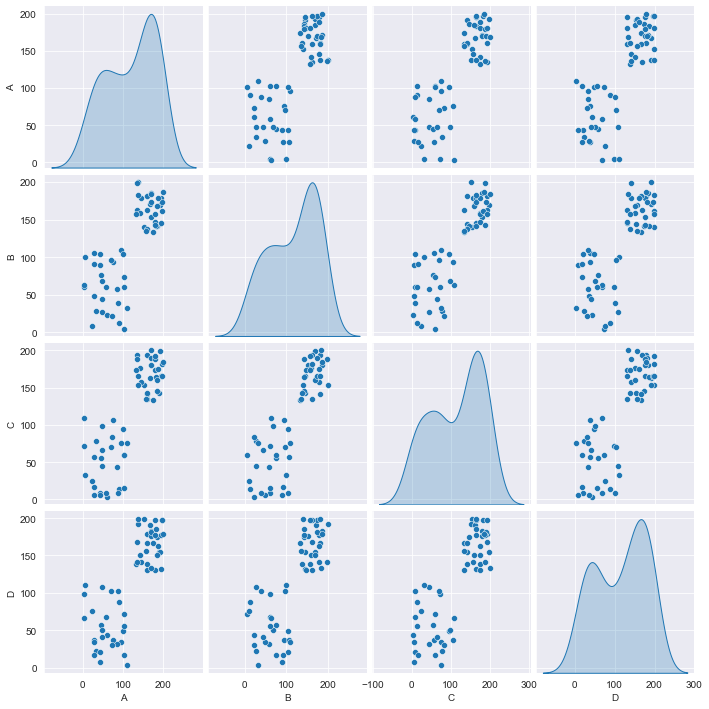

In [84]:
# visual guess of the number clusters
sns.pairplot(data=company, diag_kind='kde')
plt.show()

#### Observations:
From `pairplot` and `unique()` of `Quality` feature we know that there must be **two** clusters.

Values for QUALITY
Quality A    26
Quality B    17
Name: Quality, dtype: int64



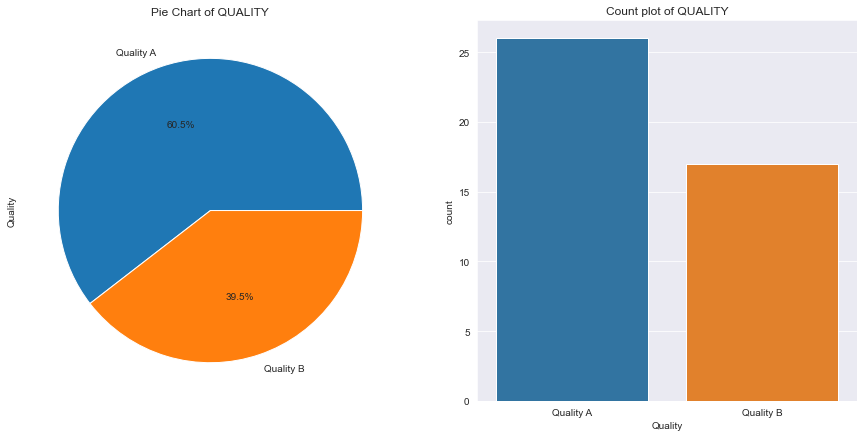

In [85]:
# seeing various values for categorical variables
print(f'Values for QUALITY')
print(company['Quality'].value_counts())
print()
pie_chart_and_count_plot(company,'Quality') # call to plotting function

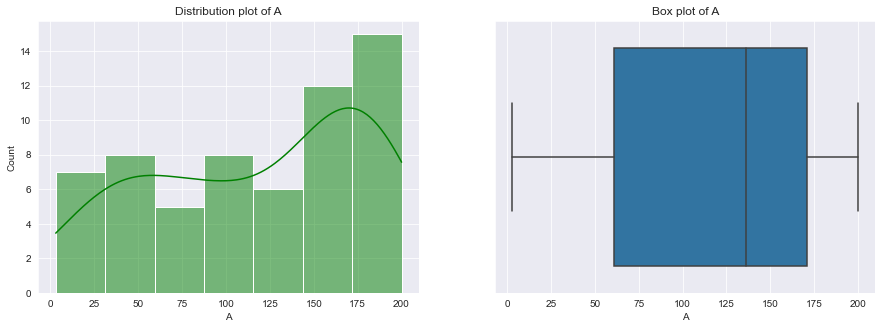

****************************************


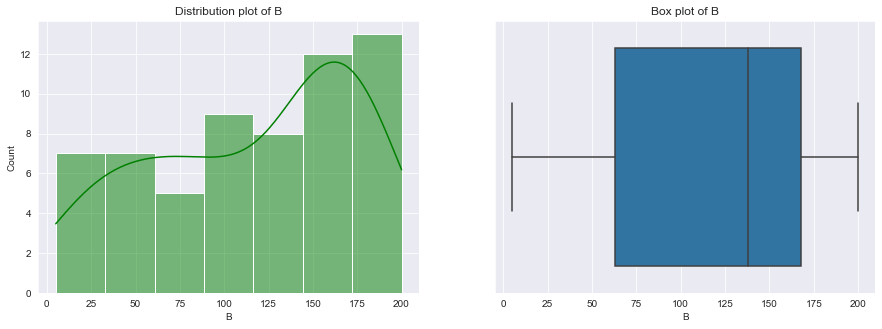

****************************************


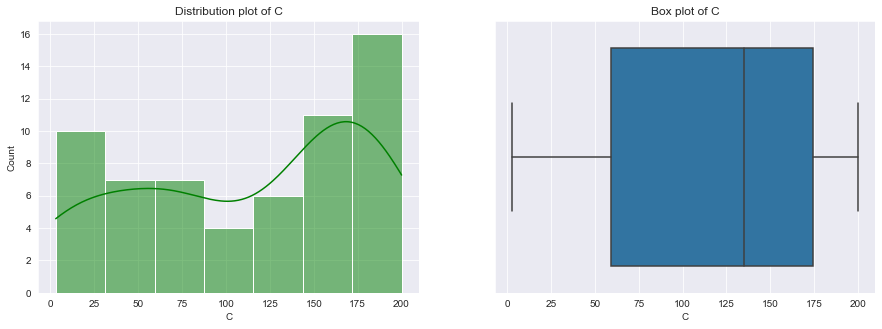

****************************************


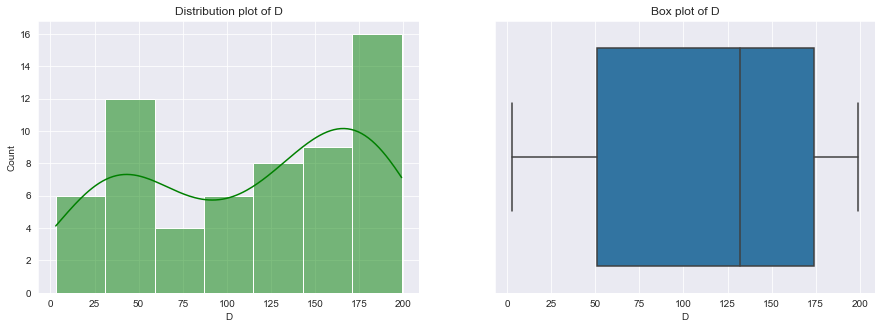

****************************************


In [86]:
outlier_cols = [] # initialising list to hold outlier columns
for col in company.columns:
    if col != 'Quality':
        plotHistogramAndBoxPlotWithOutliers(company,col,outlier_cols) # call to appropriate function
        print('*'*40)

### K-Means Clustering

In [87]:
# copying original dataset for manipulation
company_copy = company.copy()

In [88]:
# dropping the target variable
company_copy.drop(['Quality'],axis=1,inplace=True)

In [89]:
# standardising the scale
company_scaled = company_copy.apply(zscore)

In [90]:
model = KMeans(n_clusters=2)
model.fit(company_scaled) # fit the model
prediction = model.predict(company_scaled) # making predictions

# append to the data frame
company['GROUP_K2'] = prediction
company.head()

,A,B,C,D,Quality,GROUP_K2
0,47,27,45,108,Quality A,1
1,174,133,134,166,Quality B,0
2,159,163,135,131,NaN,0
3,61,23,3,44,Quality A,1
4,59,60,9,68,Quality A,1


In [188]:
# renaming the cluster labels
company['GROUP_K2'].replace({1: 'Quality A', 0: 'Quality B'},inplace=True)

In [92]:
# dropping null values
company.dropna(inplace=True)

In [93]:
def plot_confusion_matrix(actual,pred,actual_labels,pred_labels): # function to plot confusion matrix
    cm = confusion_matrix(actual,pred,labels=actual_labels) # getting the confusion matrix
    cm_df = pd.DataFrame(cm, index=[i for i in actual_labels],columns=[i for i in pred_labels])

    plt.figure(figsize=(7,5))

    sns.heatmap(cm_df, annot=True,fmt='g')
    plt.show()

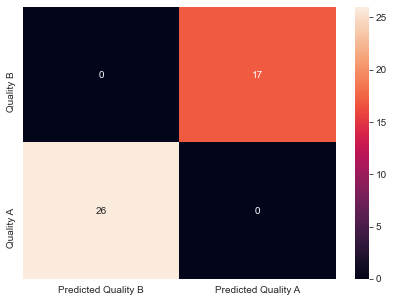

In [190]:
actual_labels = ['Quality B','Quality A']
pred_labels = ['Predicted '+label for label in actual_labels]
plot_confusion_matrix(company['Quality'],company['GROUP_K2'],actual_labels,pred_labels) # plotting confusion matrix

#### Observations:
- As we can see from the `confusion_matrix` there are no **mis-classifications**. Hence, the actual target variable and the formed clusters were the same.
- Hence, the old target variable can be easily **imputed** with the `new predicted clusters/target variables` and can be used it can be used as the target variable.

# ---------------------------------------------------------------------------------------------------------------

# Part Three - Project Based

`CONTEXT`: The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

`PROJECT OBJECTIVE`: Apply **dimensionality reduction** technique – **PCA** and train a model using principal components instead of training the model using just the raw data

### Importing the libraries

In [95]:
# majority of the libraries are imported already into the notebook from above
from sklearn.decomposition import PCA # Principal Component Analysis

# ML models
from sklearn.svm import SVC # Support Vector Classifier

# model performance
from sklearn.metrics import classification_report,accuracy_score

### Import data

In [96]:
# reading data from csv to a dataframe
vehicle = pd.read_csv('Part3 - vehicle.csv')

# verifying data import by seeing top 5 rows
vehicle.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [97]:
# analysing shape of dataframe
vehicle.shape

(846, 19)

### Data Analysis and Visualisation

In [98]:
# analysing the data types of dataframe
vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [99]:
# checking for null values
vehicle.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

#### Observations:
- There are **846** data points, **18** independant features and **1** dependant feature.
- The data types seem correct of the various features.
- There are **null** values in various data points.
- We can either **drop null** values because there seem to be enough data points or we can replace nulls with some **statistical average**.

In [100]:
# copying dataframe for manipulation, to keep original dataset intact
vehicle_copy = vehicle.copy()

In [101]:
# dropping null values
vehicle_copy.dropna(inplace=True)

Values for CLASS
car    413
bus    205
van    195
Name: class, dtype: int64



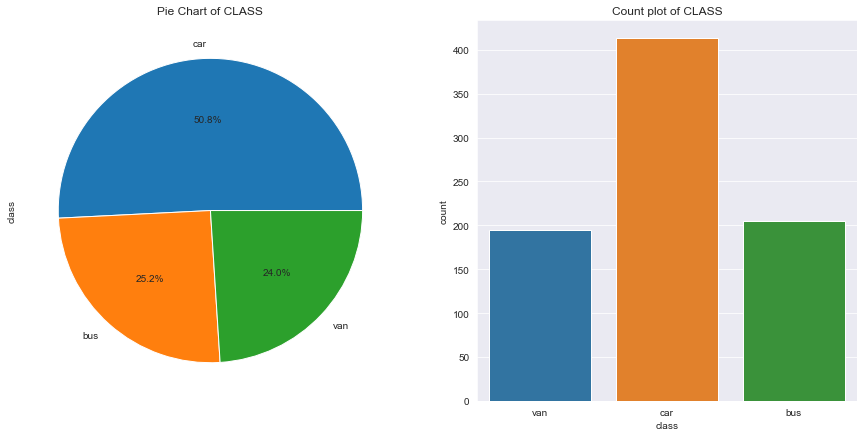

In [102]:
# seeing various values for categorical variables
print(f'Values for CLASS')
print(vehicle_copy['class'].value_counts())
print()
pie_chart_and_count_plot(vehicle_copy,'class') # call to plotting function

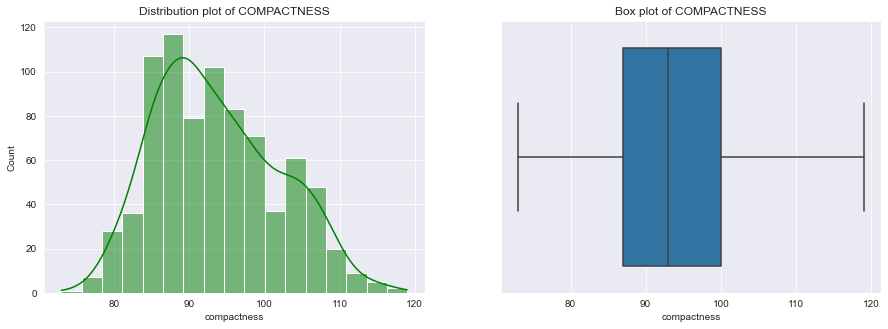

**************************************************


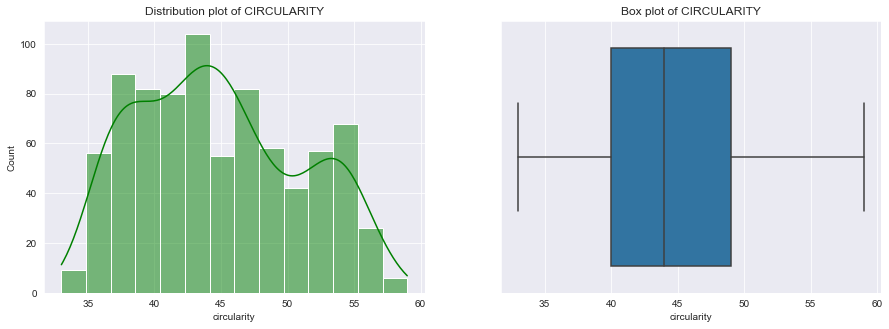

**************************************************


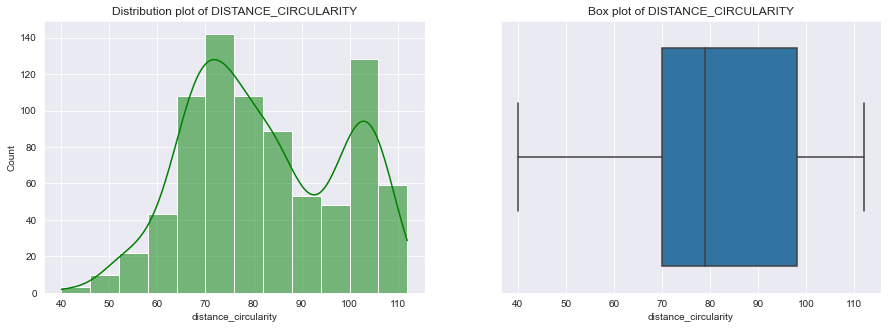

**************************************************


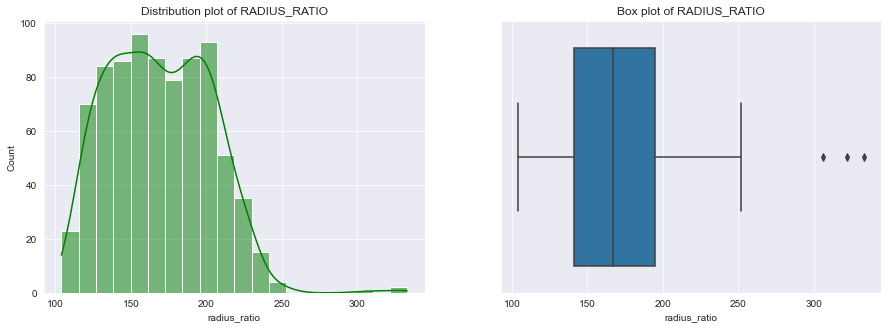

The number of outliers for radius_ratio are 3
**************************************************


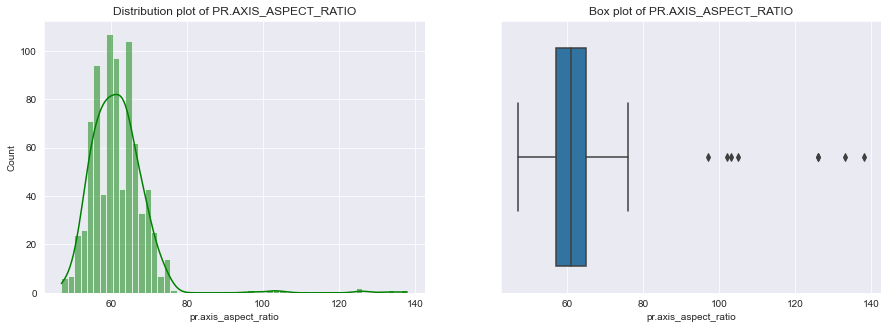

The number of outliers for pr.axis_aspect_ratio are 8
**************************************************


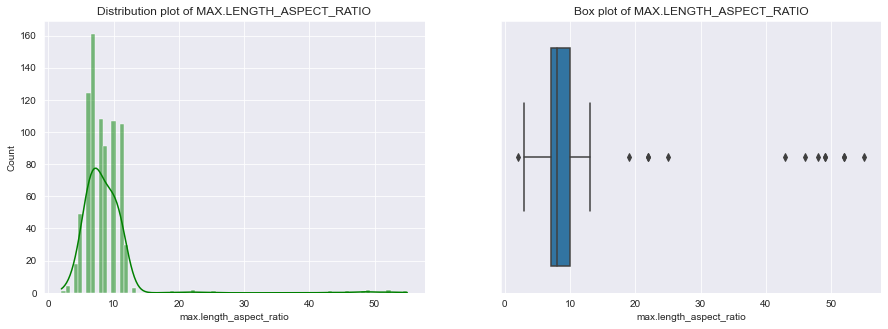

The number of outliers for max.length_aspect_ratio are 13
**************************************************


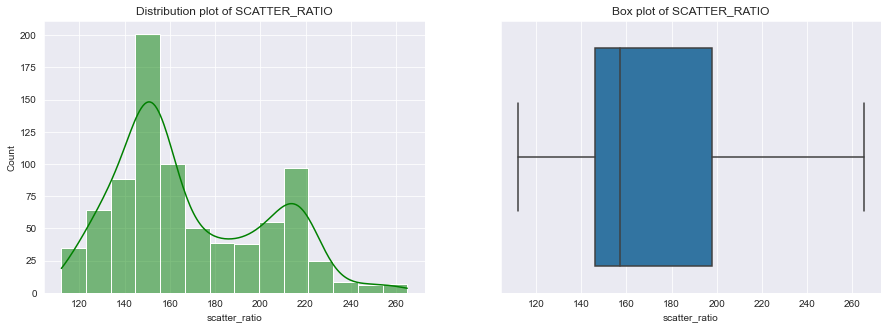

**************************************************


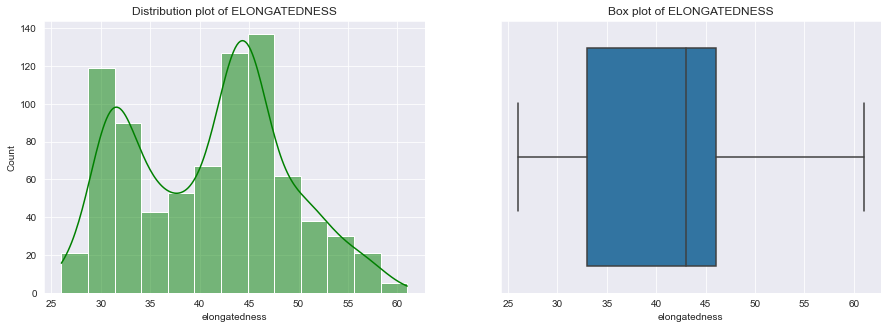

**************************************************


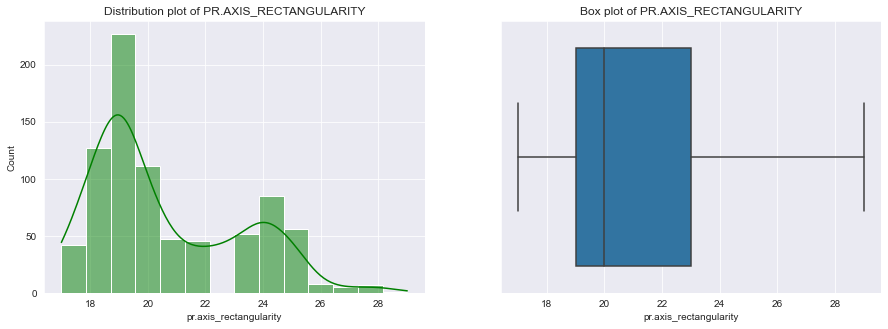

**************************************************


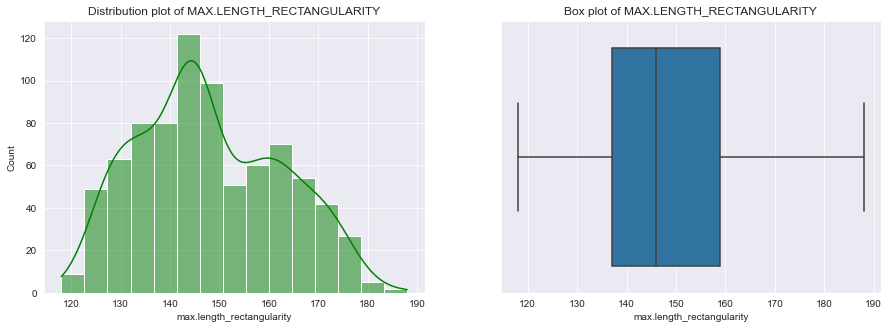

**************************************************


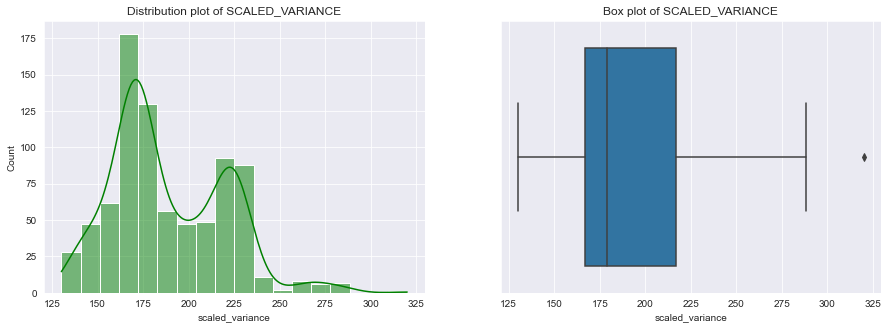

The number of outliers for scaled_variance are 1
**************************************************


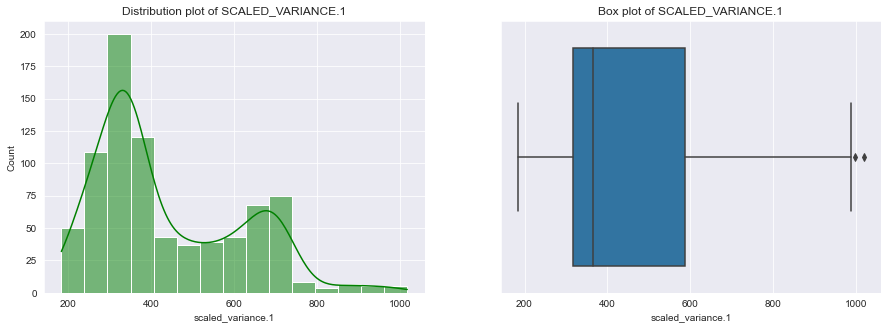

The number of outliers for scaled_variance.1 are 2
**************************************************


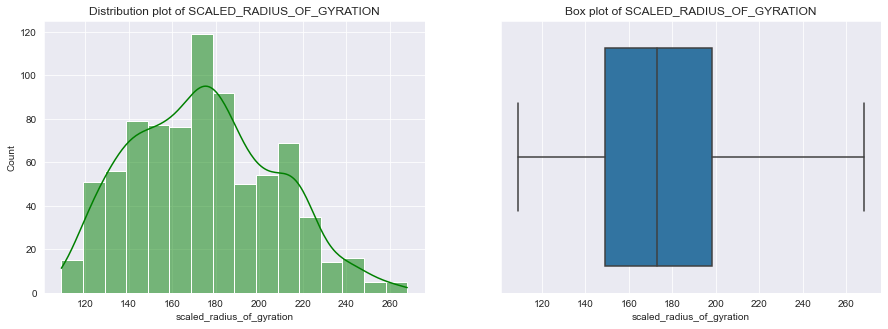

**************************************************


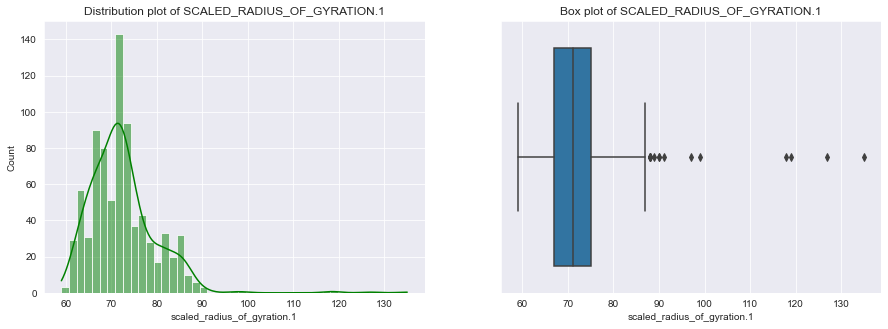

The number of outliers for scaled_radius_of_gyration.1 are 15
**************************************************


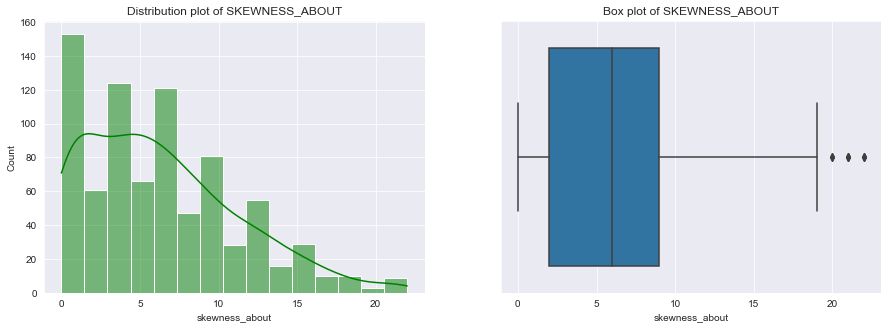

The number of outliers for skewness_about are 12
**************************************************


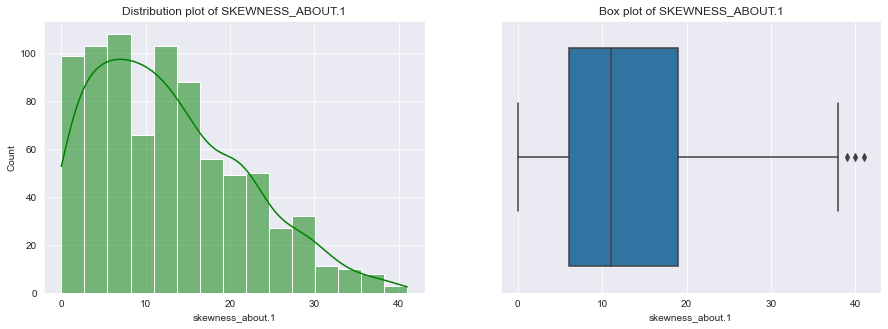

The number of outliers for skewness_about.1 are 3
**************************************************


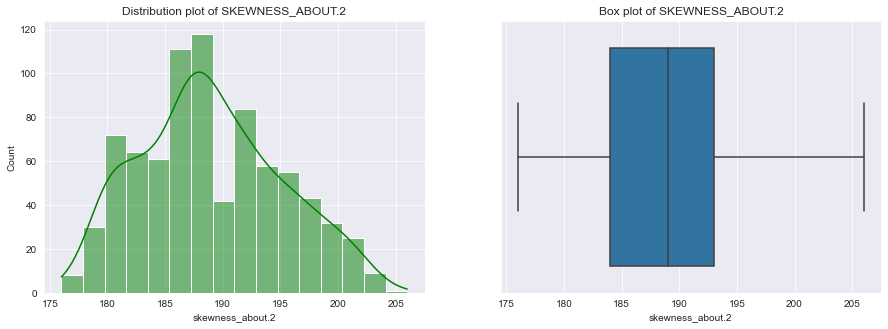

**************************************************


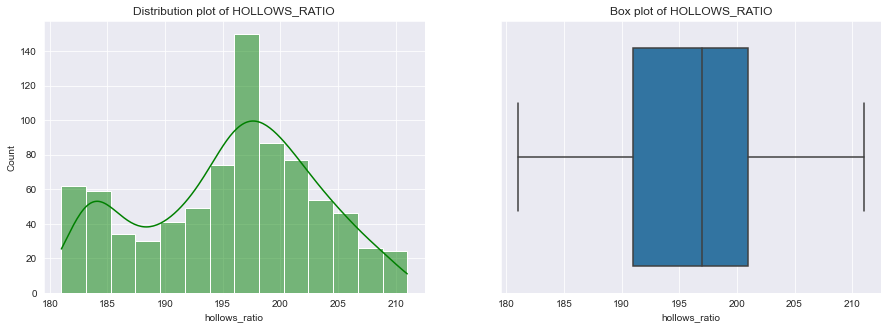

**************************************************


In [103]:
# seeing the distribution numeric features
outlier_cols = [] # initialising list to hold outlier columns
for col in vehicle_copy.columns:
    if col != 'class':
        plotHistogramAndBoxPlotWithOutliers(vehicle_copy,col,outlier_cols) # call to appropriate function
        print('*'*50)

In [104]:
# 5-point summary and other statistical features of all features
vehicle_copy.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
compactness,813.0,NaN,NaN,NaN,93.656827,8.233751,73.0,87.0,93.0,100.0,119.0
circularity,813.0,NaN,NaN,NaN,44.803198,6.146659,33.0,40.0,44.0,49.0,59.0
distance_circularity,813.0,NaN,NaN,NaN,82.04305,15.78307,40.0,70.0,79.0,98.0,112.0
radius_ratio,813.0,NaN,NaN,NaN,169.098401,33.615402,104.0,141.0,167.0,195.0,333.0
pr.axis_aspect_ratio,813.0,NaN,NaN,NaN,61.774908,7.973,47.0,57.0,61.0,65.0,138.0
max.length_aspect_ratio,813.0,NaN,NaN,NaN,8.599016,4.677174,2.0,7.0,8.0,10.0,55.0
scatter_ratio,813.0,NaN,NaN,NaN,168.563346,33.082186,112.0,146.0,157.0,198.0,265.0
elongatedness,813.0,NaN,NaN,NaN,40.98893,7.80338,26.0,33.0,43.0,46.0,61.0
pr.axis_rectangularity,813.0,NaN,NaN,NaN,20.558426,2.573184,17.0,19.0,20.0,23.0,29.0
max.length_rectangularity,813.0,NaN,NaN,NaN,147.891759,14.504648,118.0,137.0,146.0,159.0,188.0


#### Observations:
From `describe()` and the visual analysis we could observe:
- The **5-point** summary of all numeric features.
- The distribution of `skewness_about.1`, `skewness_about`, `scaled_radius_of_gyration`, `axis_aspect_ratio` are **skewed**.
- There are very few **outliers** in `radius_ratio`, `axis_aspect_ratio`, `axis_aspect_ratio`, `skewness_about`.
- There are more `car` than `bus` and `van`.

<Figure size 1800x1800 with 0 Axes>

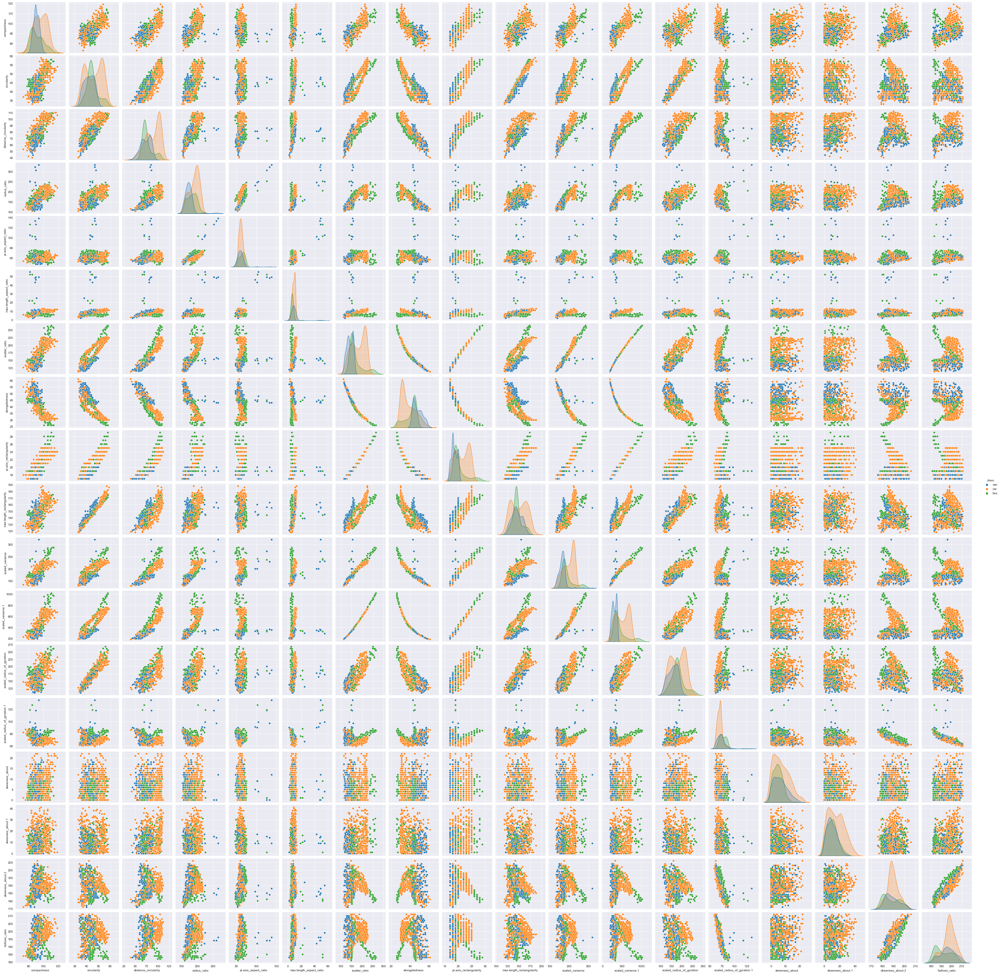

In [105]:
# pairwise scatter plots and the distributions
plt.figure(figsize=(25,25))
sns.pairplot(data=vehicle_copy,diag_kind='kde',hue='class') 
plt.show()

In [106]:
corr = vehicle_copy.corr()  # finding the correlation matrix
corr

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.689885,0.789955,0.688130,0.090557,0.150369,0.814026,-0.788051,0.814227,0.674902,0.764386,0.820240,0.581405,-0.258437,0.231648,0.168384,0.296195,0.372806
circularity,0.689885,1.000000,0.797704,0.623950,0.155023,0.251619,0.858149,-0.825108,0.856137,0.965366,0.806108,0.850932,0.935594,0.049070,0.141726,-0.001975,-0.113902,0.049331
distance_circularity,0.789955,0.797704,1.000000,0.771404,0.163386,0.265591,0.909023,-0.912713,0.897261,0.773459,0.865683,0.891789,0.705689,-0.238145,0.110280,0.277851,0.145258,0.343228
radius_ratio,0.688130,0.623950,0.771404,1.000000,0.667375,0.452460,0.743470,-0.795761,0.716210,0.570478,0.806788,0.731773,0.544636,-0.175348,0.044693,0.178079,0.375591,0.470895
pr.axis_aspect_ratio,0.090557,0.155023,0.163386,0.667375,1.000000,0.652093,0.113696,-0.191193,0.086992,0.133553,0.290375,0.100668,0.135663,0.173060,-0.059244,-0.040769,0.229702,0.257566
max.length_aspect_ratio,0.150369,0.251619,0.265591,0.452460,0.652093,1.000000,0.171445,-0.183242,0.167514,0.309180,0.331124,0.150069,0.197179,0.308329,0.016461,0.041210,-0.030543,0.139283
scatter_ratio,0.814026,0.858149,0.909023,0.743470,0.113696,0.171445,1.000000,-0.973413,0.991992,0.808154,0.950067,0.996396,0.795748,-0.045632,0.070118,0.227375,0.009967,0.138424
elongatedness,-0.788051,-0.825108,-0.912713,-0.795761,-0.191193,-0.183242,-0.973413,1.000000,-0.950345,-0.771099,-0.937846,-0.956858,-0.761563,0.119750,-0.046621,-0.201325,-0.117568,-0.233408
pr.axis_rectangularity,0.814227,0.856137,0.897261,0.716210,0.086992,0.167514,0.991992,-0.950345,1.000000,0.811979,0.935653,0.992119,0.792895,-0.033769,0.078701,0.231171,-0.017383,0.117202
max.length_rectangularity,0.674902,0.965366,0.773459,0.570478,0.133553,0.309180,0.808154,-0.771099,0.811979,1.000000,0.744760,0.796230,0.865240,0.031098,0.130356,0.013045,-0.108019,0.086792


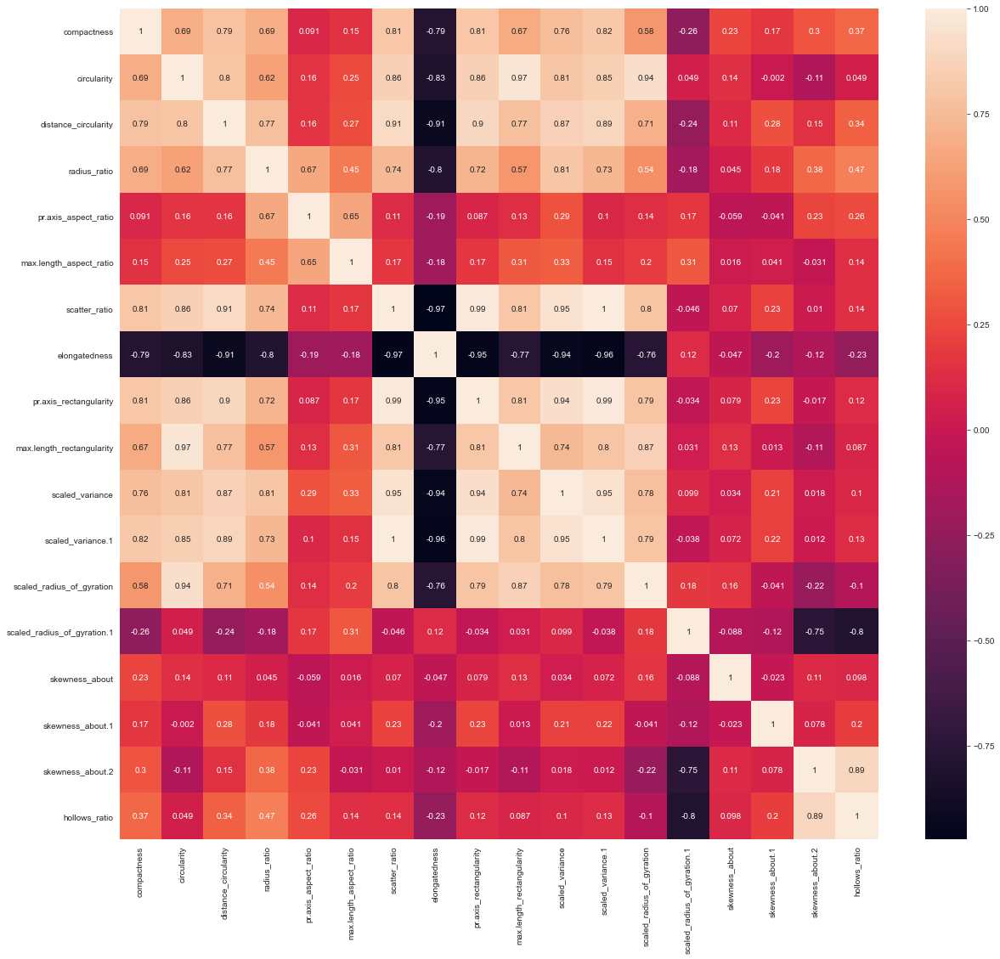

In [107]:
# visualisation of correlation matrix
plt.figure(figsize=(20,18))
sns.heatmap(corr, annot=True)
plt.show()

#### Observations:
- From the `pairplot` or `correlation matrix` or the `heatmap` we can see there is very high **negative** correlation as well as very high **positive** correlation between features.
- Imputing values in `outlier_columns` by bringing values lower than `lower_fence` upto lower_fence and values higher than `upper_fence` upto upper_fence.
- I chose this approach of correcting outliers rather than imputimg to `mean`, `median` or `zero`, because those would change concentration of data and also outliers are more similar to the boundary elements.

In [108]:
# imputing values to quartiles
pull_outliers_to_quartile_limits(vehicle_copy,outlier_cols)  # call to appropriate function

The number of outliers for radius_ratio before imputing are 3
The number of outliers for radius_ratio after imputing are 0

The number of outliers for pr.axis_aspect_ratio before imputing are 8
The number of outliers for pr.axis_aspect_ratio after imputing are 0

The number of outliers for max.length_aspect_ratio before imputing are 13
The number of outliers for max.length_aspect_ratio after imputing are 0

The number of outliers for scaled_variance before imputing are 1
The number of outliers for scaled_variance after imputing are 0

The number of outliers for scaled_variance.1 before imputing are 2
The number of outliers for scaled_variance.1 after imputing are 0

The number of outliers for scaled_radius_of_gyration.1 before imputing are 15
The number of outliers for scaled_radius_of_gyration.1 after imputing are 0

The number of outliers for skewness_about before imputing are 12
The number of outliers for skewness_about after imputing are 0

The number of outliers for skewness_about

### PCA and Machine Learning Models

In [109]:
# splitting independant and dependant variables

# independant variables
X = vehicle_copy.drop(['class'],axis=1)

# dependant variable
y = vehicle_copy[['class']]

In [110]:
# standardising the scale
XScaled = X.apply(zscore)

In [111]:
# split data into training and test data in 70:30 ratio
X_train,X_test,y_train,y_test = train_test_split(XScaled, y, test_size=0.30,random_state=1)

#### SVM with all attributes

In [112]:
# SVM with linear kernel
svc_model_linear = SVC(kernel='linear',C=1,gamma=0.1)

In [113]:
# fit the model on train data
svc_model_linear.fit(X_train,y_train)

SVC(C=1, gamma=0.1, kernel='linear')

In [114]:
# predict on test data
y_pred = svc_model_linear.predict(X_test)

In [115]:
# out-sample/test accuracy
acc_score_all_attr = accuracy_score(y_test,y_pred)
print(f'The accuracy of SVM model with all attributes is {acc_score_all_attr}')

The accuracy of SVM model with all attributes is 0.9549180327868853


In [116]:
print('Classification Report of SVM model with all attributes::')
print()
print(classification_report(y_test,y_pred))

Classification Report of SVM model with all attributes::

              precision    recall  f1-score   support

         bus       0.89      0.96      0.93        53
         car       0.98      0.94      0.96       139
         van       0.94      0.98      0.96        52

    accuracy                           0.95       244
   macro avg       0.94      0.96      0.95       244
weighted avg       0.96      0.95      0.96       244



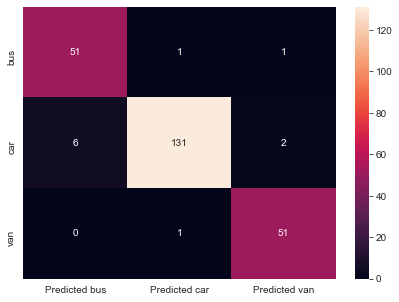

In [117]:
actual_labels = ['bus','car','van']
pred_labels = ['Predicted '+label for label in actual_labels]
plot_confusion_matrix(y_test,y_pred,actual_labels,pred_labels) # plotting confusion matrix

#### PCA

In [118]:
# creating pca model
pca = PCA(n_components=18) # using all independant variables
pca.fit(XScaled)

PCA(n_components=18)

In [119]:
# EIGEN VALUES
print(pca.explained_variance_)

[9.75592419e+00 3.26593719e+00 1.20041435e+00 1.17739558e+00
 8.54137636e-01 7.49103421e-01 3.46961731e-01 2.22403000e-01
 1.32208401e-01 9.75160321e-02 6.02445504e-02 5.48653930e-02
 3.99381171e-02 2.67746874e-02 1.87215832e-02 1.29036168e-02
 6.35471760e-03 3.63296016e-04]


In [120]:
# EIGEN VECTORS
print(pca.components_)

[[ 2.71463705e-01  2.88738771e-01  3.02090034e-01  2.68754016e-01
   9.94008356e-02  1.87354463e-01  3.10591274e-01 -3.08226743e-01
   3.07430319e-01  2.77583559e-01  3.01196840e-01  3.07688844e-01
   2.63196430e-01 -4.69296924e-02  3.95256577e-02  6.31253277e-02
   3.67354264e-02  8.75674421e-02]
 [-9.10920177e-02  1.39761567e-01 -4.95406279e-02 -1.87222724e-01
  -2.31351754e-01 -9.18135391e-02  7.01377883e-02 -7.98775531e-03
   8.37352473e-02  1.24097679e-01  7.16231923e-02  7.50976087e-02
   2.11241169e-01  5.01893835e-01 -3.97627872e-02 -9.28734091e-02
  -5.13437950e-01 -5.14003078e-01]
 [-1.13518788e-01  1.61271260e-01 -1.12460068e-01  1.75104575e-01
   5.32144075e-01  9.46421926e-02 -1.08663001e-01  4.64332067e-02
  -1.26742878e-01  1.42355297e-01 -5.23578754e-02 -1.15323821e-01
   1.85744400e-01  6.29440753e-02  2.58174083e-03 -7.21169462e-01
   1.78656433e-02 -2.13104973e-02]
 [ 1.61459674e-01  1.24375623e-01  1.14996857e-02 -2.28487196e-01
  -3.90919587e-01  1.37160863e-01 -5.

In [121]:
# PERCENTAGE OF VARIANCE EXPLAINED
print(pca.explained_variance_ratio_)

[5.41329127e-01 1.81217780e-01 6.66076568e-02 6.53304092e-02
 4.73937243e-02 4.15656675e-02 1.92519424e-02 1.23405245e-02
 7.33587685e-03 5.41089367e-03 3.34280272e-03 3.04432822e-03
 2.21605515e-03 1.48565301e-03 1.03880863e-03 7.15985842e-04
 3.52605624e-04 2.01582865e-05]


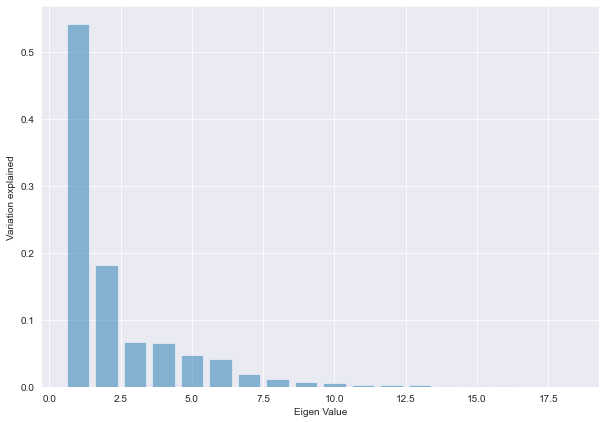

In [122]:
# percentage of variation explained
plt.figure(figsize=(10,7))
plt.bar(list(range(1,19)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('Eigen Value')
plt.show()

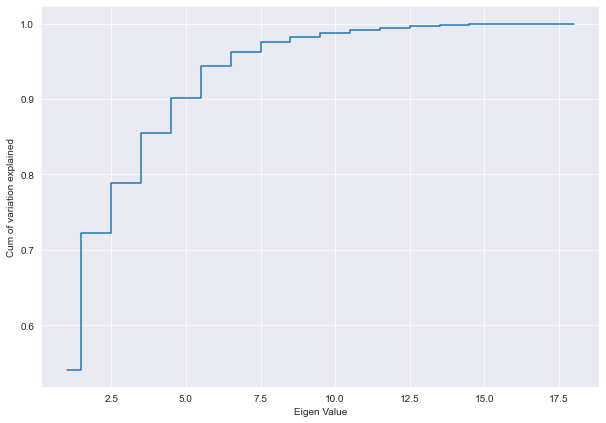

In [123]:
# cumulative variation explained
plt.figure(figsize=(10,7))
plt.step(list(range(1,19)),np.cumsum(pca.explained_variance_ratio_),where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('Eigen Value')
plt.show()

#### Observations:
- Accuracy of SVM model using all attributes is **95.5%**
- After performing `PCA`, it seems **6 to 7** features explain about **95% to 96%** of the variation of data.
- So we will go for `dimensionality reduction` to **7** features which will be indepndant to each other and linear combination of old variables.

#### Dimensionality Reduction

In [124]:
 # use only top 7 features
pca7 = PCA(n_components=7)
pca7.fit(XScaled)

PCA(n_components=7)

In [125]:
Xpca7 = pca7.fit_transform(XScaled) # transform to new variables

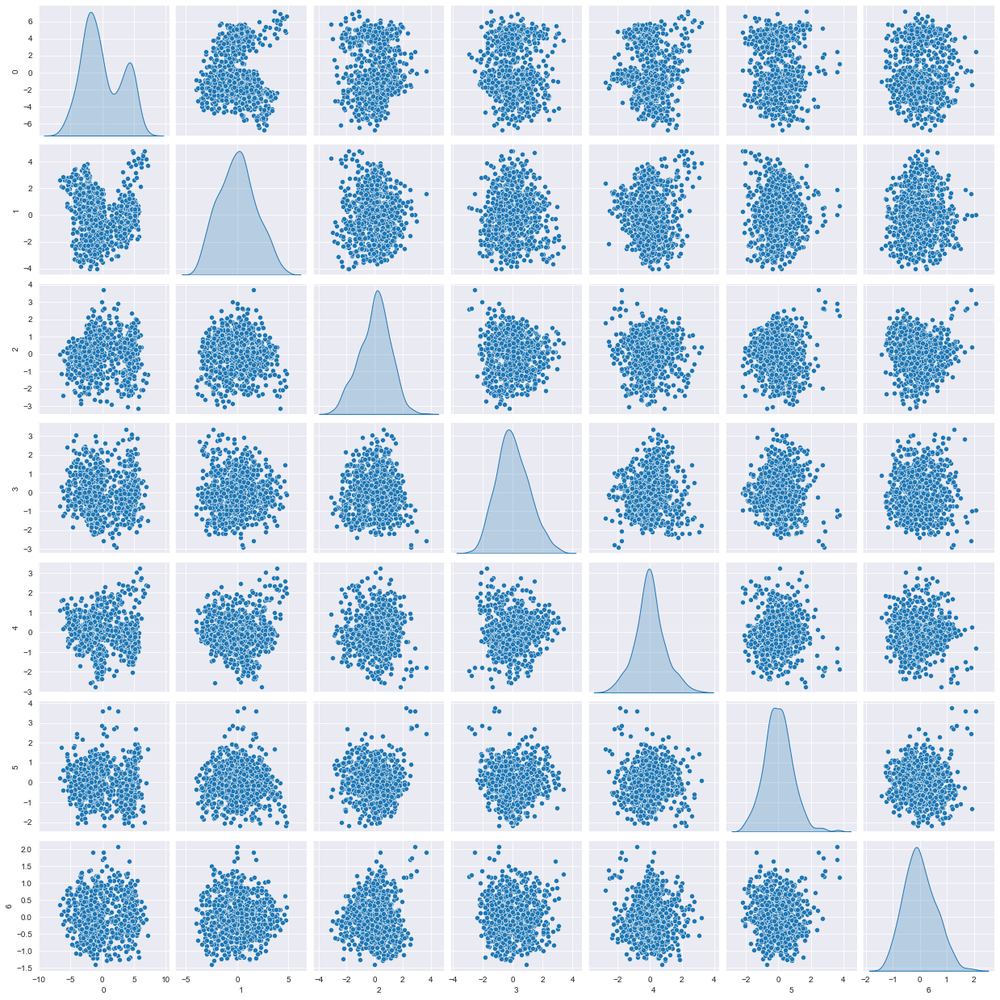

In [126]:
# verifying independant or orthogonality of transformed features
sns.pairplot(pd.DataFrame(Xpca7),diag_kind='kde')
plt.show()

#### SVM with only transformed attributes

In [127]:
# SVM with linear kernel
svc_model_linear = SVC(kernel='linear',C=1,gamma=0.1)

In [128]:
# split data into training and test data in 70:30 ratio
X_train,X_test,y_train,y_test = train_test_split(Xpca7, y, test_size=0.30,random_state=1)

In [129]:
# fit the model on train data
svc_model_linear.fit(X_train,y_train)

SVC(C=1, gamma=0.1, kernel='linear')

In [130]:
# predict on test data
y_pred = svc_model_linear.predict(X_test)

In [131]:
# out-sample/test accuracy
acc_score_few_attr = accuracy_score(y_test,y_pred)
print(f'The accuracy of SVM model with PCA transformed attributes is {acc_score_few_attr}')

The accuracy of SVM model with PCA transformed attributes is 0.8237704918032787


In [132]:
print('Classification Report of SVM model with all attributes::')
print()
print(classification_report(y_test,y_pred))

Classification Report of SVM model with all attributes::

              precision    recall  f1-score   support

         bus       0.67      0.87      0.75        53
         car       0.96      0.79      0.87       139
         van       0.74      0.87      0.80        52

    accuracy                           0.82       244
   macro avg       0.79      0.84      0.81       244
weighted avg       0.85      0.82      0.83       244



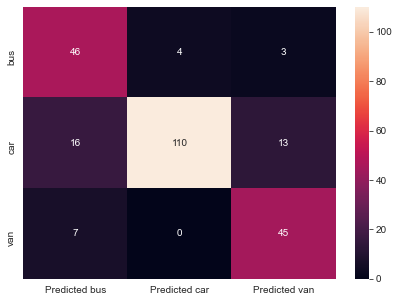

In [133]:
actual_labels = ['bus','car','van']
pred_labels = ['Predicted '+label for label in actual_labels]
plot_confusion_matrix(y_test,y_pred,actual_labels,pred_labels) # plotting confusion matrix

In [134]:
model_lists = []
model_lists.append(['Support Vector Classifier without PCA', acc_score_all_attr * 100])
model_lists.append(['Support Vector Classifier with PCA', acc_score_few_attr* 100])
mdl_df = pd.DataFrame(model_lists, columns = ['Model','Accuracy Score of Test Data'])
mdl_df

,Model,Accuracy Score of Test Data
0,Support Vector Classifier without PCA,95.491803
1,Support Vector Classifier with PCA,82.377049


#### Observations:
- Accuracy of SVM model using all **18** attributes is **95.5%**
- Accuracy of SVM model using **7** attributes is **82.37%**
- The drop in the accuracy is attributed to use of less features after `dimensionality reduction` using `PCA`. 
- This improves the **computation** time, and can overcome **curse of dimensionality**. Hence, `PCA` reduced data can be better **predictors/classifiers**.
- The `PCA` reduced features are **orthogonal/independant** of one another.

# ---------------------------------------------------------------------------------------------------------------

# Part Four - Project Based

`CONTEXT`: Company X is a **sports management company** for international cricket.

`PROJECT OBJECTIVE`: Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.

### Importing the libraries

In [135]:
# almost all the libraries have been imported from above

### Data Import

In [136]:
# importing data into a dataframe from csv
ipl = pd.read_csv('Part4 - batting_bowling_ipl_bat.csv')

# verifying data import
ipl.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [137]:
# analysing the shape
ipl.shape

(180, 7)

### Data Analysis and Visualisation

In [138]:
# checking data types
ipl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 10.0+ KB


In [139]:
# checking null values
ipl.isnull().sum()

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

#### Observations:
- There are **180** rows and **7** columns.
- All the datapoints are in correct datatypes.
- There are **90** datapoints. These won't add any value to our analysis, so we can safely drop them.

In [140]:
# creating a copy of original dataframe
ipl_copy = ipl.copy()

In [141]:
# dropping all null values
ipl_copy.dropna(inplace=True)

In [142]:
# final shape after dropping nulls
ipl_copy.shape

(90, 7)

In [143]:
def bar_plot_of_top_n_players(y_label,n):
    plt.figure(figsize=(12,6)) # setting figure parameters
    plt.title(f'Top {n} players by {y_label.upper()}')
    
    sns.barplot(x='Name',y=y_label,data=ipl_copy.sort_values(by=y_label,ascending=False).head(n)) # bar plot
    
    plt.tight_layout()
    plt.show()

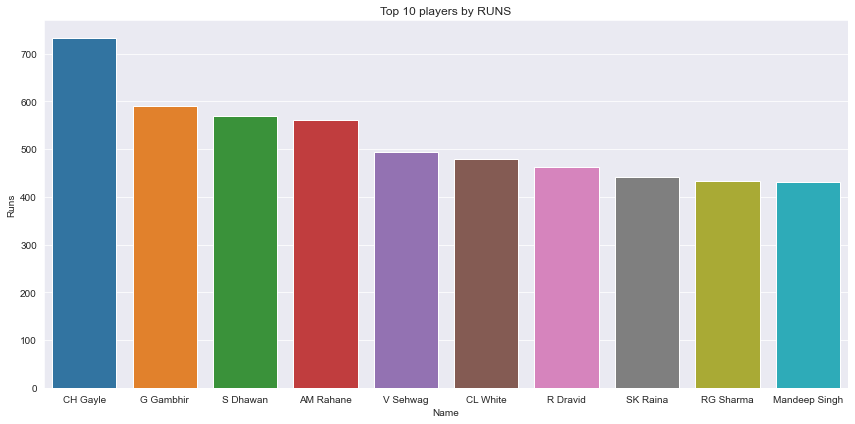


**************************************************


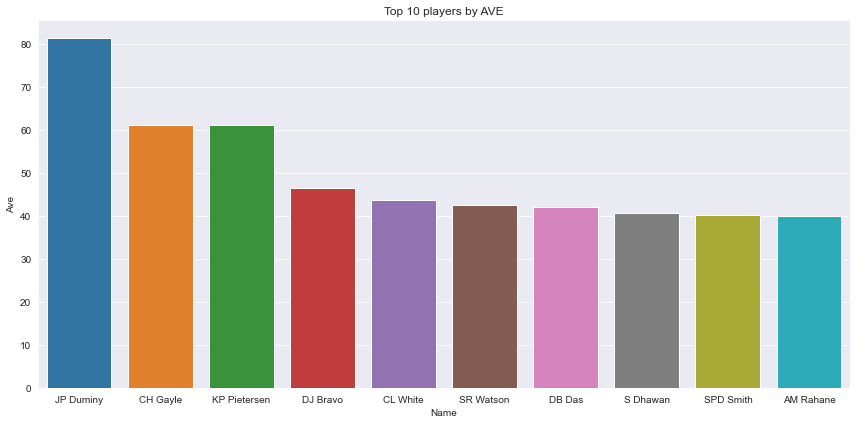


**************************************************


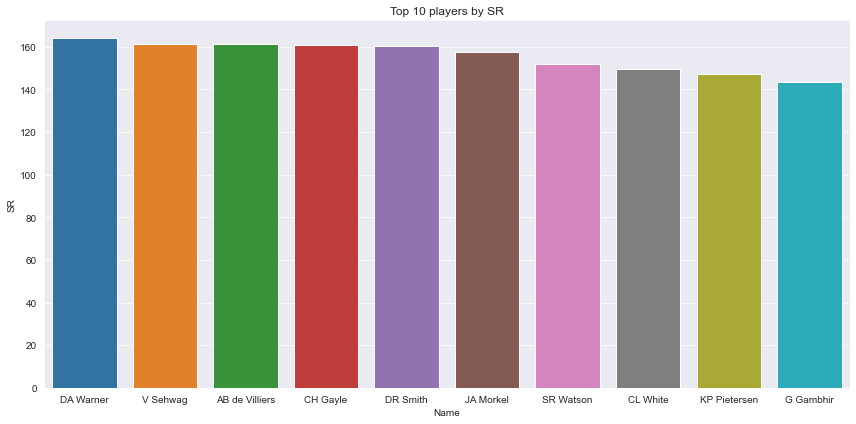


**************************************************


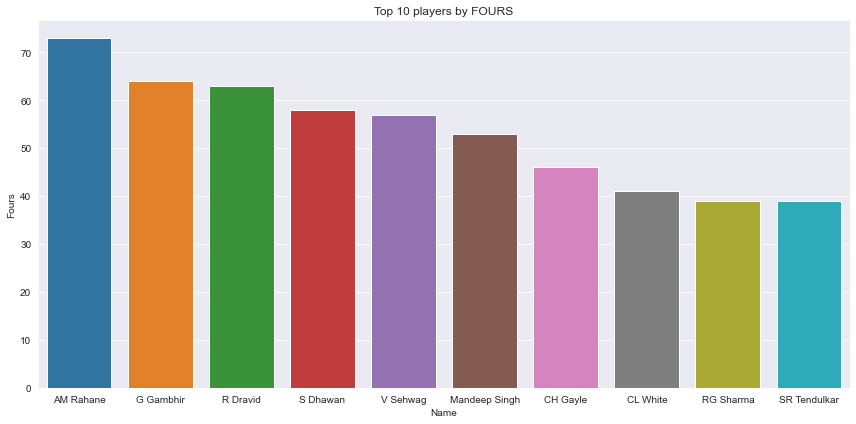


**************************************************


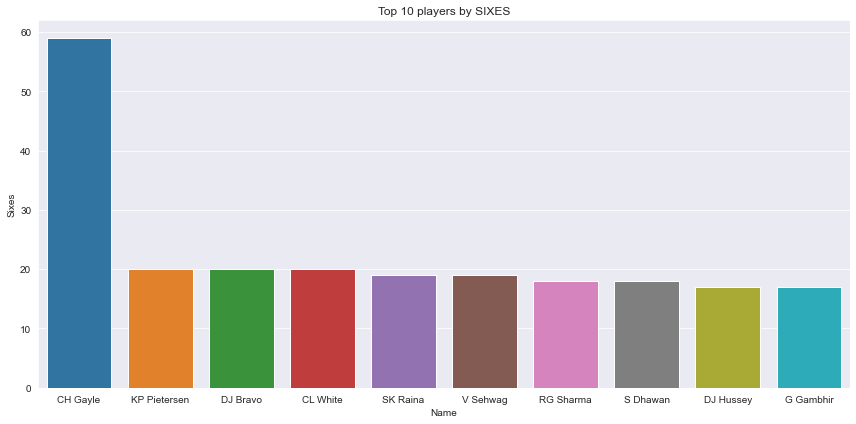


**************************************************


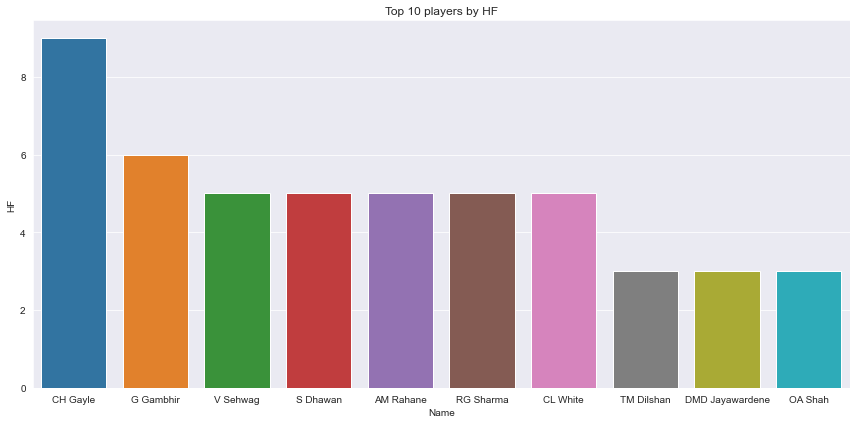


**************************************************


In [144]:
for col in ipl_copy.columns:
    if col != 'Name':
        bar_plot_of_top_n_players(col,10) # plotting top 10 records
        print()
        print('*'*50)

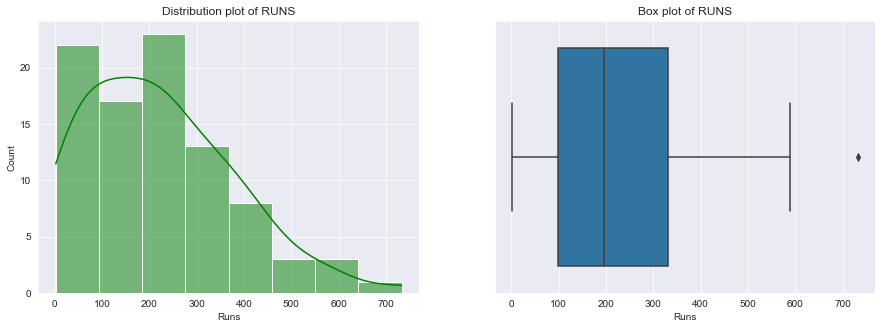

The number of outliers for Runs are 1

**************************************************


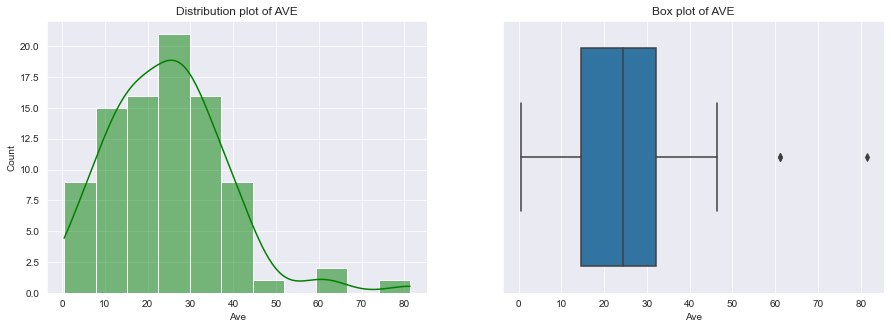

The number of outliers for Ave are 3

**************************************************


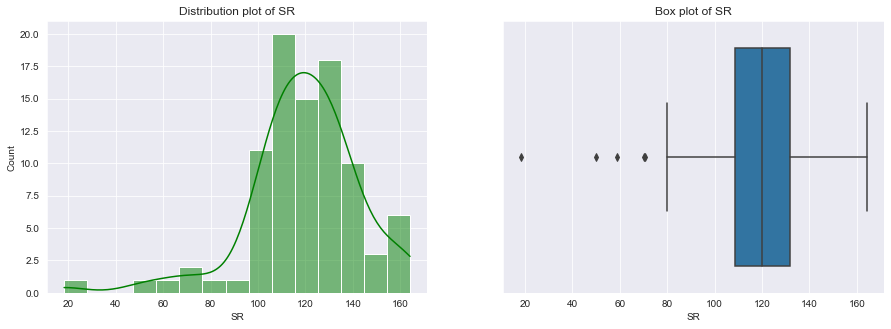

The number of outliers for SR are 5

**************************************************


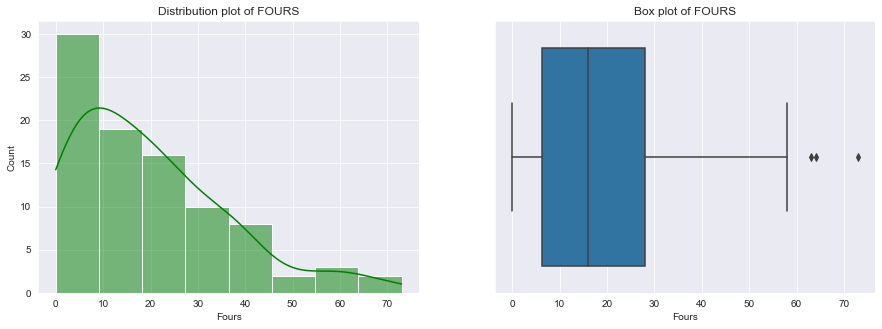

The number of outliers for Fours are 3

**************************************************


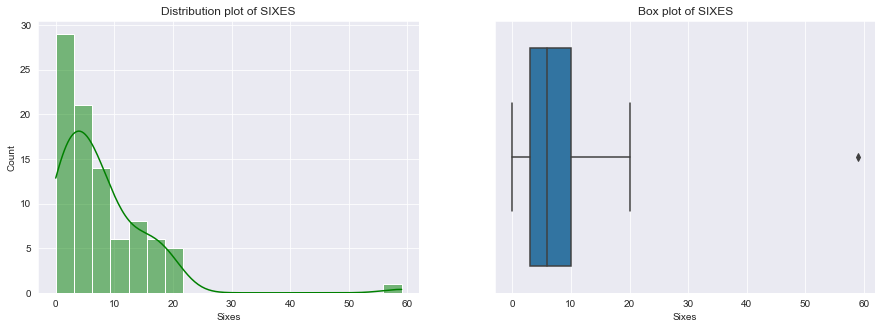

The number of outliers for Sixes are 1

**************************************************


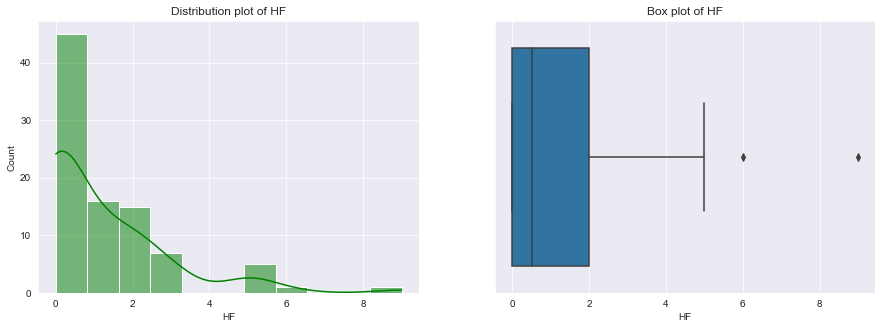

The number of outliers for HF are 2

**************************************************


In [145]:
outlier_cols = []
for col in ipl_copy.columns:
    if col != 'Name':
        plotHistogramAndBoxPlotWithOutliers(ipl_copy,col,outlier_cols) # call to appropriate function
        print()
        print('*'*50)

In [146]:
# 5-point summary
ipl_copy.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Name,90,90,R Vinay Kumar,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Runs,90.0,NaN,NaN,NaN,219.933333,156.253669,2.0,98.0,196.5,330.75,733.0
Ave,90.0,NaN,NaN,NaN,24.729889,13.619215,0.5,14.665,24.44,32.195,81.33
SR,90.0,NaN,NaN,NaN,119.164111,23.656547,18.18,108.745,120.135,131.9975,164.1
Fours,90.0,NaN,NaN,NaN,19.788889,16.399845,0.0,6.25,16.0,28.0,73.0
Sixes,90.0,NaN,NaN,NaN,7.577778,8.001373,0.0,3.0,6.0,10.0,59.0
HF,90.0,NaN,NaN,NaN,1.188889,1.688656,0.0,0.0,0.5,2.0,9.0


#### Observations:
- From `describe()` we could see the **5-point** summary of all features.
- From `histogram` all the features seem to be **skewed**.
- From `boxplot` we can see very **few outliers** in all columns.

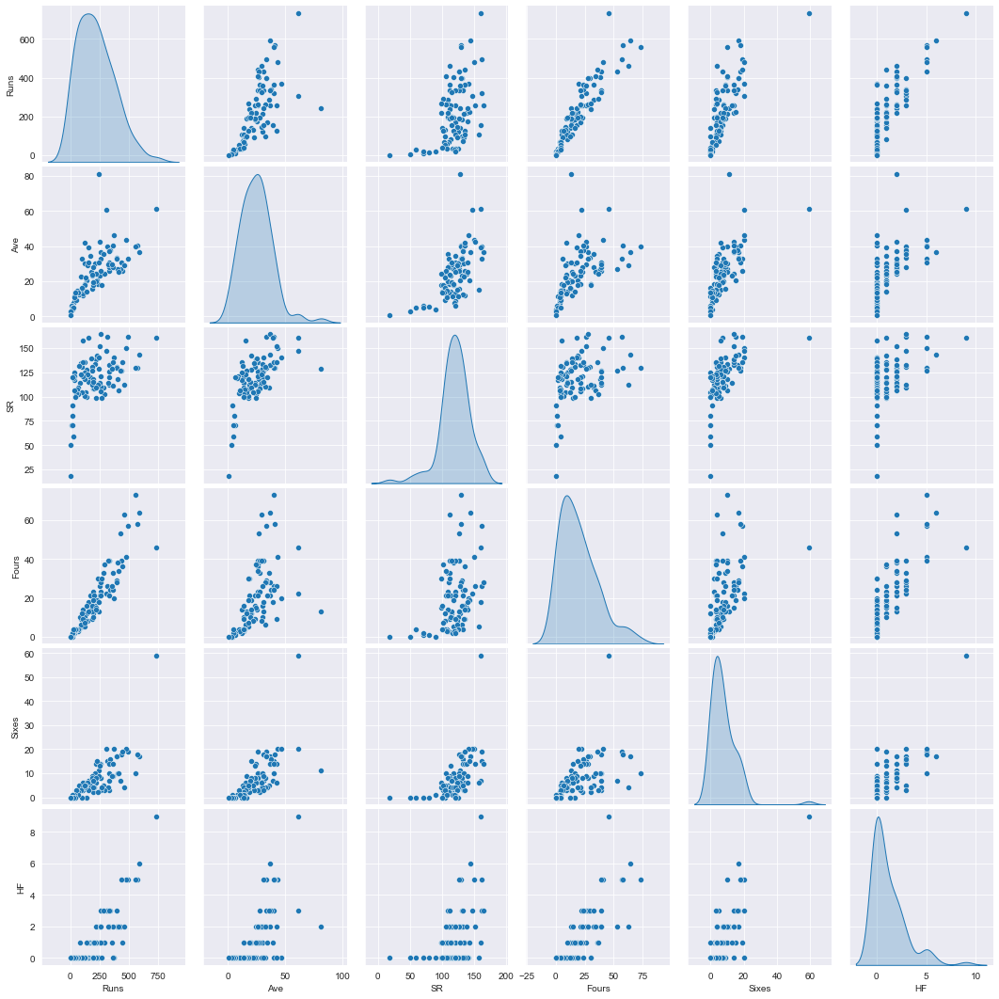

In [147]:
# pairwise scatter plot of numeric features
sns.pairplot(data=ipl_copy.iloc[:,1:],diag_kind='kde')
plt.show()

In [148]:
# correlation matrix
corr = ipl_copy.corr()
corr

,Runs,Ave,SR,Fours,Sixes,HF
Runs,1.000000,0.692984,0.493489,0.918809,0.769778,0.835148
Ave,0.692984,1.000000,0.623606,0.546211,0.682414,0.620754
SR,0.493489,0.623606,1.000000,0.384810,0.583943,0.427584
Fours,0.918809,0.546211,0.384810,1.000000,0.522574,0.783689
Sixes,0.769778,0.682414,0.583943,0.522574,1.000000,0.767696
HF,0.835148,0.620754,0.427584,0.783689,0.767696,1.000000


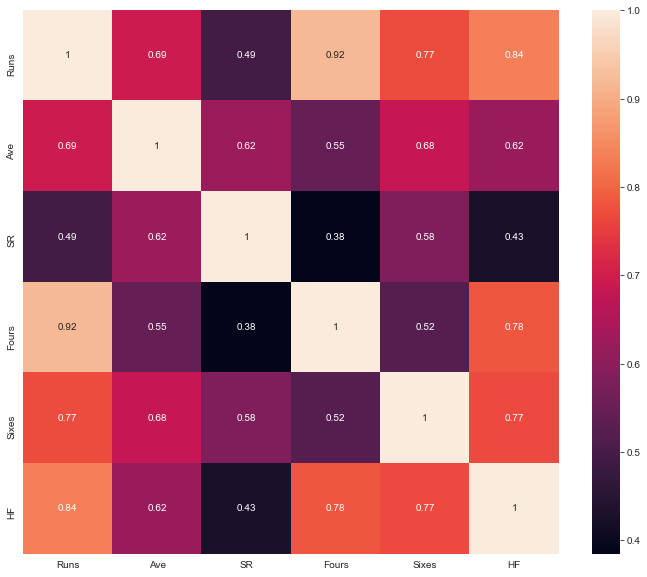

In [149]:
# visualisation of correlation matrix
plt.figure(figsize=(12,10))
sns.heatmap(corr, annot=True)
plt.show()

#### Observations:
- From `paiplot`, `correlation matrix` and `heatmap` it is evident that some of the features like `Runs vs Sixes` are **positively** correlated.
- Hence, the variables are very much dependant on one another and it is very genuine. So we can think of using **fewer** features or even do **dimensionality reduction** using `PCA` for model building.

### Machine Learning model

#### PCA

In [150]:
# extracting only numeric features
X = ipl_copy.drop(['Name'],axis=1)

In [151]:
# standardising the scale
XScaled = X.apply(zscore)

In [152]:
# creating pca model
pca = PCA(n_components=6) # using all numeric features
pca.fit(XScaled)

PCA(n_components=6)

In [153]:
# EIGEN VALUES
print(pca.explained_variance_)

[4.30252561 0.83636692 0.41665751 0.32912443 0.16567829 0.01706297]


In [154]:
# EIGEN VECTORS
print(pca.components_)

[[ 0.4582608   0.39797313  0.3253838   0.40574167  0.41733459  0.43237178]
 [ 0.26643209 -0.33111756 -0.69780334  0.47355804 -0.17902455  0.27593225]
 [-0.10977942  0.00550486 -0.45013448 -0.50823538  0.66942589  0.28082541]
 [-0.00520142  0.84736307 -0.43275029 -0.03252305 -0.24878157 -0.17811777]
 [ 0.45840889 -0.10122837 -0.11890348  0.09676885  0.39458014 -0.77486668]
 [ 0.70483594 -0.0606373   0.05624934 -0.58514214 -0.35786211  0.16096217]]


In [155]:
# PERCENTAGE OF VARIANCE EXPLAINED
print(pca.explained_variance_ratio_)

[0.70911996 0.13784566 0.06867133 0.05424458 0.02730624 0.00281223]


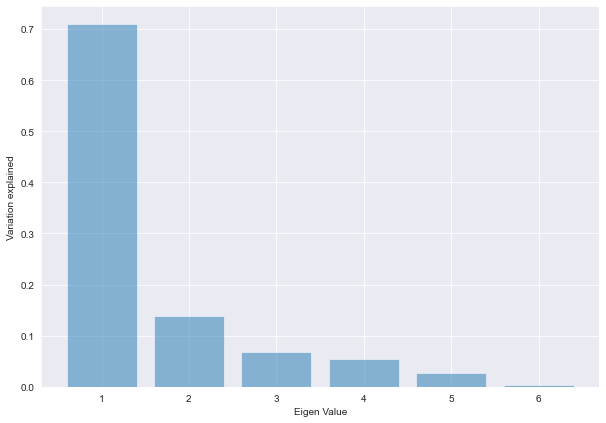

In [156]:
# percentage of variation explained
plt.figure(figsize=(10,7))
plt.bar(list(range(1,7)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('Eigen Value')
plt.show()

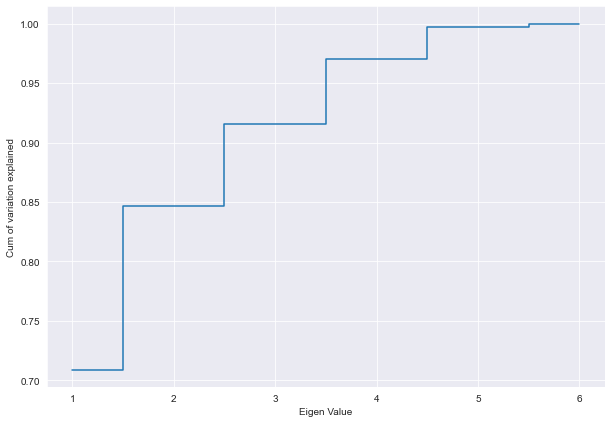

In [157]:
# cumulative variation explained
plt.figure(figsize=(10,7))
plt.step(list(range(1,7)),np.cumsum(pca.explained_variance_ratio_),where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('Eigen Value')
plt.show()

#### Observations:
- After performing `PCA`, it seems **4** features explain about **96%** of the variation of data.
- So we will go for `dimensionality reduction` to **4** features which will be **indepndant** to each other and **linear** combination of old variables.

#### Dimensionality Reduction

In [158]:
# use only top 4 features
pca4 = PCA(n_components=4)
pca4.fit(XScaled)

PCA(n_components=4)

In [159]:
Xpca4 = pca4.fit_transform(XScaled) # transform to new variables

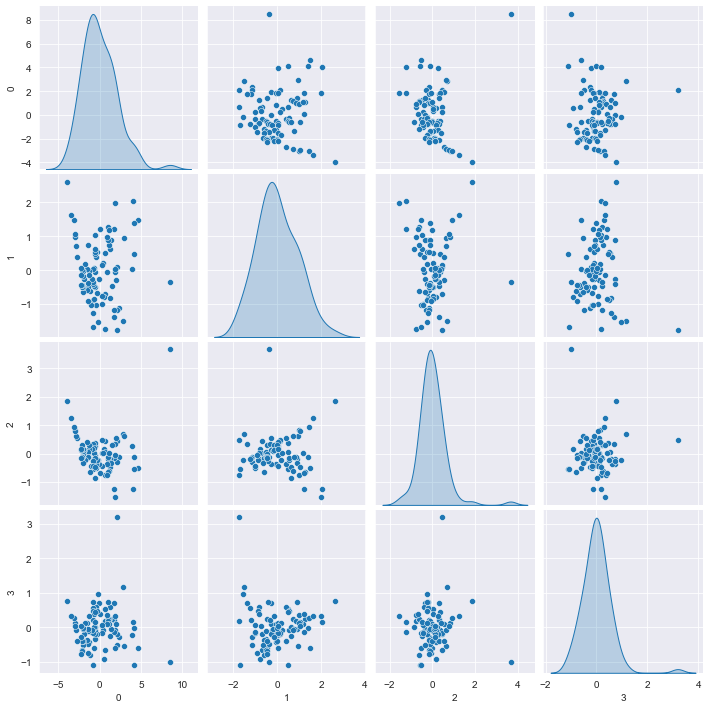

In [160]:
# verifying independant or orthogonality of transformed features
sns.pairplot(pd.DataFrame(Xpca4),diag_kind='kde')
plt.show()

#### Observations:
- The transformed features are independant of one another.
- Seems like **3** clusters would be better to separate/rank players.

### K-Means Clustering with transformed variables

In [161]:
clusters = range(2,10) # number of clusters to try
meanDistortions = [] 

for k in clusters:
    model=KMeans(n_clusters=k) # model object
    model.fit(XScaled) # fit the model
    prediction = model.predict(XScaled) # making predictions
    # taking minimum distortions
    meanDistortions.append(sum(np.min(cdist(XScaled, model.cluster_centers_, 'euclidean'), axis=1)) / XScaled.shape[0])

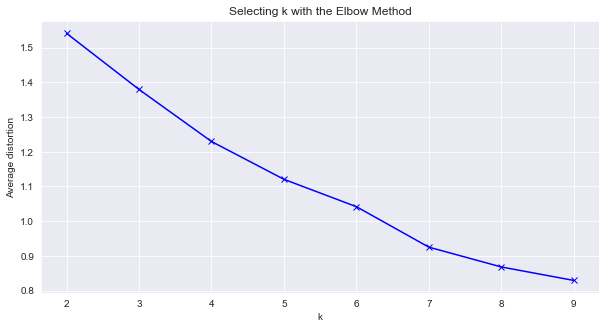

In [162]:
# plotting the average distortion
plt.figure(figsize=(10,5))
plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')
plt.show()

#### Observations:
- **4** clusters seem to be apt to rank players.

**K=4**

In [163]:
model = KMeans(n_clusters=4) # model object
model.fit(XScaled) # fit the model
prediction = model.predict(XScaled) # making predictions

# append to the data frame
XScaled['GROUP'] = prediction # for seeing difference, original data frame
XScaled['GROUP'] = prediction # for scale difference for box plot
ipl_copy['GROUP'] = prediction # to original data set
ipl_copy.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF,GROUP
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,1
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,1
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,1
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0,1
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,1


In [164]:
XScaled.groupby(by=['GROUP']).mean()

,Runs,Ave,SR,Fours,Sixes,HF
GROUP,,,,,,
0,0.633139,0.668164,0.429559,0.564805,0.445810,0.371363
1,2.132486,1.191316,1.011647,2.097750,1.938245,2.694894
2,-0.589754,-0.432593,-0.091036,-0.562606,-0.483927,-0.586181
3,-1.319810,-1.526625,-2.403115,-1.143333,-0.934411,-0.707989


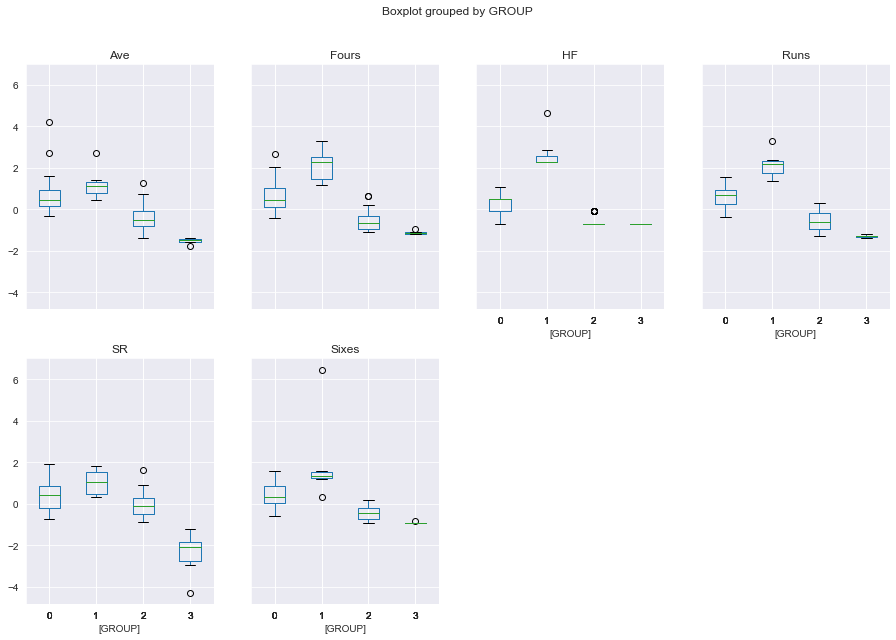

In [165]:
XScaled.boxplot(by='GROUP',layout=(2,4),figsize=(15,10))
plt.show()

In [166]:
# replacing rank with groups
ipl_copy['GROUP'].replace({0:'Grade A',1:'Grade B',2:'Grade C',3:'Grade D'},inplace=True)

In [167]:
ipl_copy['GROUP'] = ipl_copy['GROUP'].astype('category')

In [168]:
# seeing group A players
ipl_copy[ipl_copy['GROUP'] == 'Grade A']

,Name,Runs,Ave,SR,Fours,Sixes,HF,GROUP
13,KP Pietersen,305.0,61.00,147.34,22.0,20.0,3.0,Grade A
17,AB de Villiers,319.0,39.87,161.11,26.0,15.0,3.0,Grade A
19,JP Duminy,244.0,81.33,128.42,13.0,11.0,2.0,Grade A
21,DA Warner,256.0,36.57,164.10,28.0,14.0,3.0,Grade A
23,SR Watson,255.0,42.50,151.78,26.0,14.0,2.0,Grade A
25,F du Plessis,398.0,33.16,130.92,29.0,17.0,3.0,Grade A
27,OA Shah,340.0,37.77,132.81,24.0,16.0,3.0,Grade A
29,DJ Bravo,371.0,46.37,140.53,20.0,20.0,0.0,Grade A
31,DJ Hussey,396.0,33.00,129.83,28.0,17.0,2.0,Grade A
33,SK Raina,441.0,25.94,135.69,36.0,19.0,1.0,Grade A


In [169]:
# seeing group B players
ipl_copy[ipl_copy['GROUP'] == 'Grade B']

,Name,Runs,Ave,SR,Fours,Sixes,HF,GROUP
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,Grade B
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,Grade B
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,Grade B
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0,Grade B
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,Grade B
11,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0,Grade B
15,RG Sharma,433.0,30.92,126.60,39.0,18.0,5.0,Grade B


In [170]:
# seeing group C players
ipl_copy[ipl_copy['GROUP'] == 'Grade C']

,Name,Runs,Ave,SR,Fours,Sixes,HF,GROUP
77,DB Das,126.0,42.00,135.48,9.0,6.0,0.0,Grade C
79,AC Gilchrist,172.0,34.40,120.27,21.0,4.0,1.0,Grade C
83,IK Pathan,176.0,25.14,139.68,14.0,6.0,0.0,Grade C
85,Azhar Mahmood,186.0,23.25,130.98,16.0,8.0,0.0,Grade C
87,MK Pandey,143.0,20.42,127.67,12.0,6.0,1.0,Grade C
89,S Badrinath,196.0,28.00,108.28,23.0,2.0,1.0,Grade C
91,DA Miller,98.0,32.66,130.66,6.0,4.0,0.0,Grade C
93,MK Tiwary,260.0,26.00,105.69,21.0,3.0,1.0,Grade C
95,JA Morkel,107.0,15.28,157.35,5.0,6.0,0.0,Grade C
97,LRPL Taylor,197.0,19.70,115.20,12.0,7.0,1.0,Grade C


In [171]:
# seeing group D players
ipl_copy[ipl_copy['GROUP'] == 'Grade D']

,Name,Runs,Ave,SR,Fours,Sixes,HF,GROUP
167,DW Steyn,19.0,3.80,90.47,0.0,1.0,0.0,Grade D
169,A Mishra,16.0,5.33,80.00,1.0,0.0,0.0,Grade D
171,Z Khan,12.0,6.00,70.58,1.0,0.0,0.0,Grade D
173,WD Parnell,19.0,4.75,70.37,2.0,0.0,0.0,Grade D
175,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0,Grade D
177,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0,Grade D
179,R Sharma,2.0,0.50,18.18,0.0,0.0,0.0,Grade D


#### Conclusions:
- The players are segregated into various groups and can be dealt accordingly for the business case.

# ---------------------------------------------------------------------------------------------------------------

# Part Five - Question Based

### Dimensionality Reduction Techniques in Python

#### Feature Selection:
- **Missing Value Ratio** - If the dataset has too many missing values, we use this approach to reduce the number of variables. We can drop the variables having a large number of missing values in them based on a threshold.
- **Low Variance Filter** - In this we drop the variables having low variance as compared to other variables in our dataset, because the variables with a low variance will not affect the target variable.
- **High Correlation Filter** -  In this we calculate the correlation between independent numerical variables. If the correlation coefficient crosses a certain threshold value, we can drop one of the variables as they are likely to carry similar information.
- **Random Forest** - Random Forest is one of the most widely used algorithms for feature selection. It comes packaged with in-built feature importance. This helps us select a smaller subset of features.
- **Backward Feature Elimination** - In this we iteratively train the model starting from `n` variables, `n-1` variables and so on and on each step see the performance of the model and drop the variable whose removal produced no or minimal change in performance of the model.
- **Forward Feature Selection** - It is opposite to `Backward Feature Elimination`. Here, we iteratively train the model starting from `1` variable, `2` variables and so on and on each step see the performance of the model and drop the variable whose addition produced no or minimal change in performance of the model.

#### Component/Factor Based:
- **Factor Analysis** - Variables are grouped by their correlations, i.e., all variables in a particular group will have a high correlation among themselves, but a low correlation with variables of other group(s). Here, each group is known as a `factor`.
- **Principal Component Analysis(PCA)** - PCA is a technique which helps us in extracting a new set of variables known as `principal components` from an existing large set of variables and these new variables are linear combination of old variables and orthogonal.
- **Independent Component Analysis(ICA)** - ICA is a technique which helps us in extracting a new set of variables from an existing large set of variables and these new variables independant. 

#### Projection Based:
- **ISOMAP** - We use this technique when the data is strongly non-linear.
- **t- Distributed Stochastic Neighbor Embedding (t-SNE)** - This technique also works well when the data is strongly non-linear. It works extremely well for visualizations as well.
- **Uniform Manifold Approximation and Projection (UMAP)** - This technique works well for high dimensional data. Its run-time is shorter as compared to t-SNE.

## Using Dimensionality Reduction in Multi-Media(images,videos)

### Importing the libraries

In [172]:
# all majority of the libraries are imported from above
from sklearn.datasets import load_digits # to use in-built multimedia datasets

# ML model
from sklearn.naive_bayes import GaussianNB # test accuracy between original and dimensionally reduced data

from sklearn.manifold import Isomap # Projection based Dimensionality Reduction Technique

In [173]:
# loading the digits dataset
digits = load_digits()

# analysing shape 
digits.images.shape

(1797, 8, 8)

#### Observations:
- We have **1797** data points each with **8x8 =64 pixels or features**.

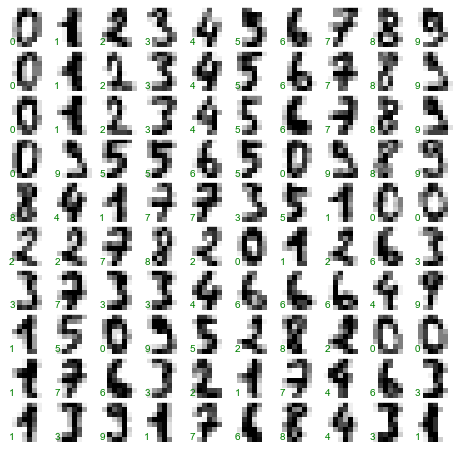

In [174]:
# visualize the first hundred of digits
import matplotlib.pyplot as plt
fig, axes = plt.subplots(10, 10, figsize=(8, 8),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i,ax in enumerate(axes.flat):
    ax.imshow(digits.images[i], cmap='binary', interpolation='nearest')
    ax.text(0.05, 0.05, str(digits.target[i]),
    transform=ax.transAxes, color='green')

In [175]:
# independant features
X = digits.data

# dependant variable
y = digits.target

In [176]:
# split data into training and test data in 70:30 ratio
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.30,random_state=1)

### GuassianNB with original data

In [177]:
model = GaussianNB() # form model object
 
model.fit(X_train, y_train) # fit the model on train data

pred = model.predict(X_test) # predict from test data

In [178]:
# calculate accuracy score
acc_score_org = accuracy_score(y_test, pred)
print(f'The accuracy of GuassainNB with original data is {acc_score_org}')

The accuracy of GuassainNB with original data is 0.8314814814814815


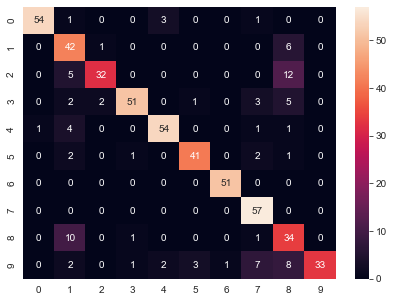

In [179]:
labels = pd.Series(y).unique()
plot_confusion_matrix(y_test,pred,labels,labels)

In [180]:
print('The Classification Report for GuassainNB with original data is::')
print(classification_report(y_test,pred))

The Classification Report for GuassainNB with original data is::
              precision    recall  f1-score   support

           0       0.98      0.92      0.95        59
           1       0.62      0.86      0.72        49
           2       0.91      0.65      0.76        49
           3       0.94      0.80      0.86        64
           4       0.92      0.89      0.90        61
           5       0.91      0.87      0.89        47
           6       0.98      1.00      0.99        51
           7       0.79      1.00      0.88        57
           8       0.51      0.74      0.60        46
           9       1.00      0.58      0.73        57

    accuracy                           0.83       540
   macro avg       0.86      0.83      0.83       540
weighted avg       0.87      0.83      0.83       540



### Dimensionality reduction using Projection Based methods

In [181]:
# transform the data to two dimensions
iso = Isomap(n_components=2)
iso.fit(digits.data)
data_projected = iso.transform(digits.data)

In [182]:
# split data into training and test data in 70:30 ratio
X_train,X_test,y_train,y_test = train_test_split(data_projected, y, test_size=0.30,random_state=1)

### GuassianNB model with reduced features

In [183]:
model = GaussianNB() # form model object
 
model.fit(X_train, y_train) # fit the model on train data

pred = model.predict(X_test) # predict from test data

In [184]:
# calculate accuracy score
acc_score_red = accuracy_score(y_test, pred)
print(f'The accuracy of GuassainNB with reduced features is {acc_score_red}')

The accuracy of GuassainNB with reduced features is 0.7222222222222222


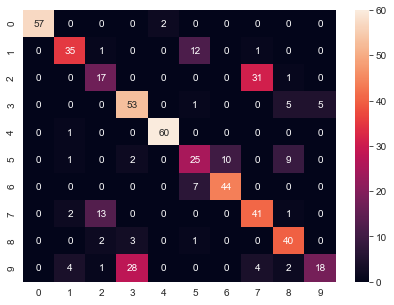

In [185]:
labels = pd.Series(y).unique()
plot_confusion_matrix(y_test,pred,labels,labels)

In [186]:
print('The Classification Report for GuassainNB with reduced data is::')
print(classification_report(y_test,pred))

The Classification Report for GuassainNB with reduced data is::
              precision    recall  f1-score   support

           0       1.00      0.97      0.98        59
           1       0.81      0.71      0.76        49
           2       0.50      0.35      0.41        49
           3       0.62      0.83      0.71        64
           4       0.97      0.98      0.98        61
           5       0.54      0.53      0.54        47
           6       0.81      0.86      0.84        51
           7       0.53      0.72      0.61        57
           8       0.69      0.87      0.77        46
           9       0.78      0.32      0.45        57

    accuracy                           0.72       540
   macro avg       0.73      0.71      0.70       540
weighted avg       0.73      0.72      0.71       540



In [187]:
model_lists = []
model_lists.append(['GuassianNB without Dimensionality Reduction', acc_score_org * 100])
model_lists.append(['GuassianNB with Dimensionality Reduction', acc_score_red* 100])
mdl_df = pd.DataFrame(model_lists, columns = ['Model','Accuracy Score of Test Data'])
mdl_df

,Model,Accuracy Score of Test Data
0,GuassianNB without Dimensionality Reduction,83.148148
1,GuassianNB with Dimensionality Reduction,72.222222


#### Observations:
- We were able to reduce dimensions in multi-media.
- The accuracy reduced but we were able to get good results even with low dimensions.